<a href="https://colab.research.google.com/github/rishitadhalbisoi/google3D/blob/contributors%2Fveronica/Veronica'sCopy_Google3D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Google3D: YouTube Viral Video Forecasting

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.ensemble import IsolationForest
from collections import Counter
import re
import nltk
from nltk.corpus import stopwords

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Setup and Data Preprocessing
### 1. Set up project environment and create project documents.
### 2. Initial exploration of the dataset: identify and document missing values, outliers, and anomalies.
### 3. Data cleaning and transform data in Jupyter Notebook.

### Set up project environment and create project documents.
- Local environment is Jupyter Notebook.
- Cloud environment is Google Colab: [Colab Link](https://colab.research.google.com/drive/1cVB57dHD5CbpfPgP-XYBUL5nEoHCuiz2?usp=sharing)
- Project code maintained via GitHub: [Repo Link](https://github.com/rishitadhalbisoi/google3D)
- Project documents on Google Drive: [Drive Link](https://drive.google.com/drive/folders/1pNN3CvPdAQdRNCBkhGE_OcEM6hFn15vm?usp=sharing)

### Initial exploration of the dataset.

In [ ]:
# Load dataset

dataset = '/content/drive/My Drive/Google3D/US_YT_Trending_Data.csv'
df = pd.read_csv(dataset)
df

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11T19:20:14Z,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11T17:00:10Z,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,False,False,"While running her own modding shop, Ramya Pare..."
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11T16:34:06Z,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11T16:38:55Z,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11T15:10:05Z,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12T00:00:00Z,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,False,False,Transforming The LaBrant Family's empty white ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268782,4-uXvx5M7XA,Total solar eclipse causing tourism boost acro...,2024-04-08T15:55:44Z,UClwddNv0Cr6SIEGkzVK886w,FOX 9 Minneapolis-St. Paul,25,2024-04-15T00:00:00Z,morning-news|Eclipses|travel|travel news|weath...,359130,2345,0,581,https://i.ytimg.com/vi/4-uXvx5M7XA/default.jpg,False,False,Millions of people in the United States are tr...
268783,aFsfJYWpqII,Food Delivery Apps: Last Week Tonight with Joh...,2024-04-04T11:00:02Z,UC3XTzVzaHQEd30rQbuvCtTQ,LastWeekTonight,24,2024-04-15T00:00:00Z,[None],3998181,107811,0,10335,https://i.ytimg.com/vi/aFsfJYWpqII/default.jpg,False,False,"John Oliver discusses food delivery apps, how ..."
268784,pRAsQss17xs,12 Things NO-ONE Tells You About Japan | Feat....,2024-04-07T14:53:25Z,UCHL9bfHTxCMi-7vfxQ-AYtg,Abroad in Japan,24,2024-04-15T00:00:00Z,japan|cdawgva|abroad in japan|trash taste,873960,41941,0,1918,https://i.ytimg.com/vi/pRAsQss17xs/default.jpg,False,False,We reveal 12 things no-one tells you to expect...
268785,84QeCD7y_Ds,Buying My Dream Car At 21,2024-04-07T18:00:03Z,UChQ-d14tHB62nskossxO0tw,Joe Fazer,24,2024-04-15T00:00:00Z,gym|youtube|bodybuilder|powerlifter|vlog|vlogg...,535842,42845,0,1852,https://i.ytimg.com/vi/84QeCD7y_Ds/default.jpg,False,False,Use code JOE at checkout to get discounts on M...


In [ ]:
# Dataset size
print(f'{df.shape[0]} rows')
print(f'{df.shape[1]} columns')

268787 rows
16 columns


In [ ]:
# Display first five rows

df.head()

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11T19:20:14Z,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11T17:00:10Z,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,False,False,"While running her own modding shop, Ramya Pare..."
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11T16:34:06Z,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11T16:38:55Z,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11T15:10:05Z,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12T00:00:00Z,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,False,False,Transforming The LaBrant Family's empty white ...


In [ ]:
# Display column names and corresponding data types

df.dtypes

# object- likely a string value

,0
video_id,object
title,object
publishedAt,object
channelId,object
channelTitle,object
categoryId,int64
trending_date,object
tags,object
view_count,int64
likes,int64


In [ ]:
# Summary statistics for numerical data

df.describe()

,categoryId,view_count,likes,dislikes,comment_count
count,268787.000000,2.687870e+05,2.687870e+05,268787.000000,2.687870e+05
mean,18.743511,2.734467e+06,1.314697e+05,1134.277495,1.014303e+04
std,6.786562,9.794087e+06,4.539469e+05,8047.291315,7.260853e+04
min,1.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
25%,17.000000,4.725410e+05,1.796300e+04,0.000000,1.280000e+03
50%,20.000000,9.368710e+05,4.020500e+04,0.000000,2.754000e+03
75%,24.000000,2.106178e+06,9.877300e+04,467.000000,6.386000e+03
max,29.000000,1.407644e+09,1.602153e+07,879354.000000,6.738537e+06


In [ ]:
# Summary statistics for categorical data

df.describe(include=['object'])

,video_id,title,publishedAt,channelId,channelTitle,trending_date,tags,thumbnail_link,description
count,268787,268787,268787,268787,268787,268787,268787,268787,264238
unique,47142,48471,46554,8302,8543,1323,32909,47142,48448
top,3ryID_SwU5E,Starlink Mission,2023-12-16T17:00:01Z,UCDVYQ4Zhbm3S2dlz7P1GBDg,NFL,2021-06-17T00:00:00Z,[None],https://i.ytimg.com/vi/3ryID_SwU5E/default.jpg,Check out our other channels:NFL Mundo https:/...
freq,37,238,46,1793,1793,400,44494,37,853


In [ ]:
# Look at the number of unique channel ids = 8302
# Videos from these channels may be more likely to go viral

df['channelId'].nunique()

8302

In [ ]:

df['view_count'].describe()

,view_count
count,2.687870e+05
mean,2.734467e+06
std,9.794087e+06
min,0.000000e+00
25%,4.725410e+05
50%,9.368710e+05
75%,2.106178e+06
max,1.407644e+09


### Identify and document missing values, outliers, and anomalies.

In [ ]:
# Check for missing values

missing_values = df.isnull().sum()
missing_percentage = df.isnull().mean() * 100

# Document missing data

missing_df = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percentage
})

# Display columns with missing data- only the description column has null values

missing_df = missing_df[missing_df['Missing Values'] > 0]
missing_df

,Missing Values,Percentage
description,4549,1.692418


In [ ]:
numerical_cols_to_check = df.select_dtypes(include=[np.number]).columns

# Calculate IQR to identify outliers

def calculate_iqr_outliers(param_df):
    outliers_mask = pd.DataFrame(False, index=param_df.index, columns=param_df.columns)

    for column in param_df.columns:
        Q1 = param_df[column].quantile(0.25)
        Q3 = param_df[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers_mask[column] = (param_df[column] < lower_bound) | (param_df[column] > upper_bound)

    outliers_any_column = outliers_mask.any(axis=1)
    outliers_df = param_df[outliers_any_column]

    return outliers_df

outliers_df = calculate_iqr_outliers(df[numerical_cols_to_check])
outliers_df['video_id'] = df.loc[outliers_df.index, 'video_id'].values
outliers_df = outliers_df.reset_index(drop=True)
outliers_df

# 78827 rows have outliers in their numerical data

,categoryId,view_count,likes,dislikes,comment_count,video_id
0,22,1514614,156908,5855,35313,3C66w5Z0ixs
1,20,2381688,146739,2794,16549,M9Pmf9AB4Mo
2,24,2038853,353787,2628,40221,J78aPJ3VyNs
3,10,496771,23251,1856,7647,kXLn3HkpjaA
4,24,1402687,95694,2158,6613,SnsPZj91R7E
...,...,...,...,...,...,...
78822,1,1048965,61823,0,3561,jyYIiWZNptQ
78823,1,3049093,207252,0,13835,SV9SwKd6J3w
78824,10,5406115,156300,0,7471,ktjvgseCjYE
78825,24,23820264,720335,0,33664,d7DdLRe5QgM


In [ ]:
# Identifying anomalies via Z-score

z_scores = np.abs(stats.zscore(df[numerical_cols_to_check]))
z_anomalies_df = df[(z_scores > 3).any(axis=1)]
z_anomalies_df

# Z-score detection yields 4941 anomalies

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
35,GGEBtW2mWOk,Addressing RUMORS About Me While Testing New M...,2020-08-09T19:00:30Z,UCkvK_5omS-42Ovgah8KRKtg,jeffreestar,26,2020-08-12T00:00:00Z,jeffree star|jeffree star cosmetics|patrick st...,3427335,147162,62615,32307,https://i.ytimg.com/vi/GGEBtW2mWOk/default.jpg,False,False,Today I'm testing out ALL brand new makeup whi...
51,hsm4poTWjMs,Cardi B - WAP feat. Megan Thee Stallion [Offic...,2020-08-07T04:00:10Z,UCxMAbVFmxKUVGAll0WVGpFw,Cardi B,10,2020-08-12T00:00:00Z,Cardi B|Cardi|Atlantic Records|rap|hip hop|tra...,76805026,2820345,382578,270263,https://i.ytimg.com/vi/hsm4poTWjMs/default.jpg,False,False,Cardi B - WAP feat. Megan Thee StallionStream/...
128,QsUfsZzxi9c,"Whatever You Build, I'll Pay For!",2020-08-06T17:00:23Z,UCIPPMRA040LQr5QPyJEbmXA,MrBeast Gaming,20,2020-08-12T00:00:00Z,[None],13073796,1643982,16286,97749,https://i.ytimg.com/vi/QsUfsZzxi9c/default.jpg,False,False,We have a giant area of land and whatever you ...
159,JSAfPh1A25E,TREASURE - 'BOY' M/V,2020-08-07T09:00:09Z,UCx9hXYOCvUYwrprEqe4ZQHA,TREASURE (트레저),24,2020-08-12T00:00:00Z,YG Entertainment|YG|와이지|K-pop|트레져|트레저|TREASURE...,18534845,1447194,25142,335075,https://i.ytimg.com/vi/JSAfPh1A25E/default.jpg,False,False,BOY Woah ohYeah넌 마치 beautiful danger쳐다볼 수 없어너무...
260,GGEBtW2mWOk,Addressing RUMORS About Me While Testing New M...,2020-08-09T19:00:30Z,UCkvK_5omS-42Ovgah8KRKtg,jeffreestar,26,2020-08-13T00:00:00Z,jeffree star|jeffree star cosmetics|patrick st...,3635239,152011,66088,33959,https://i.ytimg.com/vi/GGEBtW2mWOk/default.jpg,False,False,Today I'm testing out ALL brand new makeup whi...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268578,mKdjycj-7eE,"Stop This Train, Win a Lamborghini",2024-03-16T16:00:00Z,UCX6OQ3DkcsbYNE6H8uQQuVA,MrBeast,24,2024-04-14T00:00:00Z,[None],116840290,4302366,0,127313,https://i.ytimg.com/vi/mKdjycj-7eE/default.jpg,False,False,I still can’t believe what happened in this vi...
268580,kRlxTJSPKK8,Natanael Cano || BZRP Music Sessions #59,2024-04-04T00:00:30Z,UCmS75G-98QihSusY7NfCZtw,Bizarrap,24,2024-04-14T00:00:00Z,Bizarrap|Bzrp|bzpp|bizapop|music session|bisar...,25109822,1503617,0,108925,https://i.ytimg.com/vi/kRlxTJSPKK8/default.jpg,False,False,00:00 Endiamantado02:33 Entre las de 20Natan...
268636,erLbbextvlY,7 Days Stranded On An Island,2024-03-30T16:00:01Z,UCX6OQ3DkcsbYNE6H8uQQuVA,MrBeast,24,2024-04-15T00:00:00Z,[None],117202051,4772606,0,133663,https://i.ytimg.com/vi/erLbbextvlY/default.jpg,False,False,I can’t believe we actually did thisSend money...
268702,wboGYls1Bns,Pushpa 2 The Rule Teaser | Allu Arjun | Sukuma...,2024-04-08T05:37:05Z,UCKZSn5C-RzrLjuWJF8wWiDw,Mythri Movie Makers,24,2024-04-15T00:00:00Z,Pushpa 2 The Rule Teaser|Allu Arjun|Sukumar|Ra...,112497953,1634699,0,54080,https://i.ytimg.com/vi/wboGYls1Bns/default.jpg,False,False,Pushpa 2 The Rule Teaser on Mythri Movie Maker...


In [ ]:
# Identifying anomalies using Isolation Forest

iso_forest = IsolationForest(contamination=0.1)
df['if_anomaly'] = iso_forest.fit_predict(df[numerical_cols_to_check])

if_anomalies_df = df[df['if_anomaly'] == -1]
df = df.drop(['if_anomaly'], axis=1)

if_anomalies_df = if_anomalies_df.reset_index(drop=True)

print(if_anomalies_df.loc[if_anomalies_df['view_count'].idxmax()])

if_anomalies_df

# IsolationForest yields 26416 anomalies

video_id                                                   cc2-4ci4G84
title                                     Discord Loot Boxes are here.
publishedAt                                       2024-04-01T17:46:17Z
channelId                                     UCZ5XnGb-3t7jCkXdawN2tkA
channelTitle                                                   Discord
categoryId                                                          24
trending_date                                     2024-04-03T00:00:00Z
tags                                                            [None]
view_count                                                  1407643634
likes                                                           126926
dislikes                                                             0
comment_count                                                    13987
thumbnail_link          https://i.ytimg.com/vi/cc2-4ci4G84/default.jpg
comments_disabled                                                False
rating

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,if_anomaly
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11T19:20:14Z,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,-1
1,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11T16:34:06Z,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...,-1
2,6TIsR_7nrNc,Kylie Jenner Reacts To 'WAP' Music Video Backlash,2020-08-10T18:41:19Z,UC2rJLq19N0dGrxfib80M_fg,HollywoodLife,24,2020-08-12T00:00:00Z,kylie jenner|kendall jenner|cardi b|wap|reacts...,1007540,10102,7932,2763,https://i.ytimg.com/vi/6TIsR_7nrNc/default.jpg,False,False,Kylie Jenner dissed over cameo in Cardi B and ...,-1
3,jbGRowa5tIk,ITZY “Not Shy” M/V TEASER,2020-08-11T15:00:13Z,UCaO6TYtlC8U5ttz62hTrZgg,JYP Entertainment,10,2020-08-12T00:00:00Z,JYP Entertainment|JYP|ITZY|있지|ITZY Video|ITZY ...,5999732,714287,15174,31039,https://i.ytimg.com/vi/jbGRowa5tIk/default.jpg,False,False,ITZY Not Shy M/V[ITZY Official] https://www.yo...,-1
4,vePc5V4h_kg,Shark Attack Test- Human Blood vs. Fish Blood,2020-08-09T16:00:11Z,UCY1kMZp36IQSyNx_9h4mpCg,Mark Rober,28,2020-08-12T00:00:00Z,sharks|sharkweek|jaws|shark attack|blood in wa...,14684474,544038,15818,33507,https://i.ytimg.com/vi/vePc5V4h_kg/default.jpg,False,False,I personally got in the water and tested if Sh...,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26874,VZIm_2MgdeA,JoJo Siwa - Karma (Official Video),2024-04-05T04:00:06Z,UCK4Gv-nQkIl-n17sfSmshGA,JoJoSiwaVEVO,10,2024-04-15T00:00:00Z,JoJo Siwa New Song|JoJo Siwa Karma|JoJo Siwa O...,22050057,202646,0,195995,https://i.ytimg.com/vi/VZIm_2MgdeA/default.jpg,False,False,Official Video for “Karma” by JoJo Siwa Listen...,-1
26875,mKdjycj-7eE,"Stop This Train, Win a Lamborghini",2024-03-16T16:00:00Z,UCX6OQ3DkcsbYNE6H8uQQuVA,MrBeast,24,2024-04-15T00:00:00Z,[None],117249490,4309093,0,127492,https://i.ytimg.com/vi/mKdjycj-7eE/default.jpg,False,False,I still can’t believe what happened in this vi...,-1
26876,SV9SwKd6J3w,R O U N D 6 ｜ Alien Stage,2024-04-05T09:00:08Z,UCch9Dmg5Juwp8MZGvAmAp4Q,VIVINOS,1,2024-04-15T00:00:00Z,[None],3049093,207252,0,13835,https://i.ytimg.com/vi/SV9SwKd6J3w/default.jpg,False,False,[Alien Stage IVAN & TILL MD Pre-order]📡 https:...,-1
26877,d7DdLRe5QgM,skibidi toilet 72 (full episode),2024-04-05T06:30:18Z,UCsSsgPaZ2GSmO6il8Cb5iGA,DaFuq!?Boom!,24,2024-04-15T00:00:00Z,sfm animation|skibidi toilet vs cameramen|skib...,23820264,720335,0,33664,https://i.ytimg.com/vi/d7DdLRe5QgM/default.jpg,False,False,"g-toilet, astro toilets and titans clash in co...",-1


### 3. Data cleaning and transform data in Jupyter Notebook.

In [ ]:
# Converting publishedAt and trending_date to Datetime format

df['publishedAt'] = pd.to_datetime(df['publishedAt']) # publishedAt has a date and time
df['trending_date'] = pd.to_datetime(df['trending_date']) # trending date has no associated time
df[['publishedAt', 'trending_date']].head()

,publishedAt,trending_date
0,2020-08-11 19:20:14+00:00,2020-08-12 00:00:00+00:00
1,2020-08-11 17:00:10+00:00,2020-08-12 00:00:00+00:00
2,2020-08-11 16:34:06+00:00,2020-08-12 00:00:00+00:00
3,2020-08-11 16:38:55+00:00,2020-08-12 00:00:00+00:00
4,2020-08-11 15:10:05+00:00,2020-08-12 00:00:00+00:00


In [ ]:
# Feature engineering year, month, day, time

df['publishedAt_year'] = df['publishedAt'].dt.year
df['publishedAt_month'] = df['publishedAt'].dt.month
df['publishedAt_date'] = df['publishedAt'].dt.day
df['publishedAt_time'] = df['publishedAt'].dt.time

df['trendingDate_year'] = df['trending_date'].dt.year
df['trendingDate_month'] = df['trending_date'].dt.month
df['trendingDate_date'] = df['trending_date'].dt.day

# Display the first few rows to check the new columns
df[['publishedAt_year', 'publishedAt_month', 'publishedAt_date', 'publishedAt_time',
          'trendingDate_year', 'trendingDate_month', 'trendingDate_date']]


,publishedAt_year,publishedAt_month,publishedAt_date,publishedAt_time,trendingDate_year,trendingDate_month,trendingDate_date
0,2020,8,11,19:20:14,2020,8,12
1,2020,8,11,17:00:10,2020,8,12
2,2020,8,11,16:34:06,2020,8,12
3,2020,8,11,16:38:55,2020,8,12
4,2020,8,11,15:10:05,2020,8,12
...,...,...,...,...,...,...,...
268782,2024,4,8,15:55:44,2024,4,15
268783,2024,4,4,11:00:02,2024,4,15
268784,2024,4,7,14:53:25,2024,4,15
268785,2024,4,7,18:00:03,2024,4,15


In [ ]:
# Handling missing values
# Above analysis shows the only categorical column with null values is the description column
# We can either DROP those values or fill with an empty value ''

df.dropna(subset=['description'], inplace=True)
df = df.reset_index(drop=True)
df.isnull().sum()

,0
video_id,0
title,0
publishedAt,0
channelId,0
channelTitle,0
categoryId,0
trending_date,0
tags,0
view_count,0
likes,0


In [ ]:
# Add human readable category_name column

category_mapping = {
    1:'Film & Animation',
    2:'Autos & Vehicles',
    10:'Music',
    15:'Music',
    17:'Sports',
    19:'Travel & Events',
    20:'Gaming',
    22:'Videoblogging',
    23:'Comedy',
    24:'Entertainment',
    25:'News & Politics',
    26:'Howto & Style',
    27:'Education',
    28:'Science & Technology',
    29:'Nonprofits & Activism'
}

df.insert(df.columns.get_loc('categoryId'), 'category_name', df['categoryId'].map(category_mapping))
df

,video_id,title,publishedAt,channelId,channelTitle,category_name,categoryId,trending_date,tags,view_count,...,comments_disabled,ratings_disabled,description,publishedAt_year,publishedAt_month,publishedAt_date,publishedAt_time,trendingDate_year,trendingDate_month,trendingDate_date
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11 19:20:14+00:00,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,Videoblogging,22,2020-08-12 00:00:00+00:00,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,...,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,2020,8,11,19:20:14,2020,8,12
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11 17:00:10+00:00,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,Gaming,20,2020-08-12 00:00:00+00:00,Apex Legends|Apex Legends characters|new Apex ...,2381688,...,False,False,"While running her own modding shop, Ramya Pare...",2020,8,11,17:00:10,2020,8,12
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11 16:34:06+00:00,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,Entertainment,24,2020-08-12 00:00:00+00:00,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,...,False,False,I left youtube for a month and this is what ha...,2020,8,11,16:34:06,2020,8,12
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11 16:38:55+00:00,UCbg_UMjlHJg_19SZckaKajg,XXL,Music,10,2020-08-12 00:00:00+00:00,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,...,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...,2020,8,11,16:38:55,2020,8,12
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11 15:10:05+00:00,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,Howto & Style,26,2020-08-12 00:00:00+00:00,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,...,False,False,Transforming The LaBrant Family's empty white ...,2020,8,11,15:10:05,2020,8,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264233,4-uXvx5M7XA,Total solar eclipse causing tourism boost acro...,2024-04-08 15:55:44+00:00,UClwddNv0Cr6SIEGkzVK886w,FOX 9 Minneapolis-St. Paul,News & Politics,25,2024-04-15 00:00:00+00:00,morning-news|Eclipses|travel|travel news|weath...,359130,...,False,False,Millions of people in the United States are tr...,2024,4,8,15:55:44,2024,4,15
264234,aFsfJYWpqII,Food Delivery Apps: Last Week Tonight with Joh...,2024-04-04 11:00:02+00:00,UC3XTzVzaHQEd30rQbuvCtTQ,LastWeekTonight,Entertainment,24,2024-04-15 00:00:00+00:00,[None],3998181,...,False,False,"John Oliver discusses food delivery apps, how ...",2024,4,4,11:00:02,2024,4,15
264235,pRAsQss17xs,12 Things NO-ONE Tells You About Japan | Feat....,2024-04-07 14:53:25+00:00,UCHL9bfHTxCMi-7vfxQ-AYtg,Abroad in Japan,Entertainment,24,2024-04-15 00:00:00+00:00,japan|cdawgva|abroad in japan|trash taste,873960,...,False,False,We reveal 12 things no-one tells you to expect...,2024,4,7,14:53:25,2024,4,15
264236,84QeCD7y_Ds,Buying My Dream Car At 21,2024-04-07 18:00:03+00:00,UChQ-d14tHB62nskossxO0tw,Joe Fazer,Entertainment,24,2024-04-15 00:00:00+00:00,gym|youtube|bodybuilder|powerlifter|vlog|vlogg...,535842,...,False,False,Use code JOE at checkout to get discounts on M...,2024,4,7,18:00:03,2024,4,15


In [ ]:
# Check for duplicates and drop duplicates

duplicates = df.duplicated().sum()
print(f'{duplicates} duplicates')

df = df.drop_duplicates()
df = df.reset_index(drop=True)
df

83 duplicates


,video_id,title,publishedAt,channelId,channelTitle,category_name,categoryId,trending_date,tags,view_count,...,comments_disabled,ratings_disabled,description,publishedAt_year,publishedAt_month,publishedAt_date,publishedAt_time,trendingDate_year,trendingDate_month,trendingDate_date
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11 19:20:14+00:00,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,Videoblogging,22,2020-08-12 00:00:00+00:00,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,...,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,2020,8,11,19:20:14,2020,8,12
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11 17:00:10+00:00,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,Gaming,20,2020-08-12 00:00:00+00:00,Apex Legends|Apex Legends characters|new Apex ...,2381688,...,False,False,"While running her own modding shop, Ramya Pare...",2020,8,11,17:00:10,2020,8,12
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11 16:34:06+00:00,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,Entertainment,24,2020-08-12 00:00:00+00:00,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,...,False,False,I left youtube for a month and this is what ha...,2020,8,11,16:34:06,2020,8,12
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11 16:38:55+00:00,UCbg_UMjlHJg_19SZckaKajg,XXL,Music,10,2020-08-12 00:00:00+00:00,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,...,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...,2020,8,11,16:38:55,2020,8,12
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11 15:10:05+00:00,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,Howto & Style,26,2020-08-12 00:00:00+00:00,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,...,False,False,Transforming The LaBrant Family's empty white ...,2020,8,11,15:10:05,2020,8,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264150,4-uXvx5M7XA,Total solar eclipse causing tourism boost acro...,2024-04-08 15:55:44+00:00,UClwddNv0Cr6SIEGkzVK886w,FOX 9 Minneapolis-St. Paul,News & Politics,25,2024-04-15 00:00:00+00:00,morning-news|Eclipses|travel|travel news|weath...,359130,...,False,False,Millions of people in the United States are tr...,2024,4,8,15:55:44,2024,4,15
264151,aFsfJYWpqII,Food Delivery Apps: Last Week Tonight with Joh...,2024-04-04 11:00:02+00:00,UC3XTzVzaHQEd30rQbuvCtTQ,LastWeekTonight,Entertainment,24,2024-04-15 00:00:00+00:00,[None],3998181,...,False,False,"John Oliver discusses food delivery apps, how ...",2024,4,4,11:00:02,2024,4,15
264152,pRAsQss17xs,12 Things NO-ONE Tells You About Japan | Feat....,2024-04-07 14:53:25+00:00,UCHL9bfHTxCMi-7vfxQ-AYtg,Abroad in Japan,Entertainment,24,2024-04-15 00:00:00+00:00,japan|cdawgva|abroad in japan|trash taste,873960,...,False,False,We reveal 12 things no-one tells you to expect...,2024,4,7,14:53:25,2024,4,15
264153,84QeCD7y_Ds,Buying My Dream Car At 21,2024-04-07 18:00:03+00:00,UChQ-d14tHB62nskossxO0tw,Joe Fazer,Entertainment,24,2024-04-15 00:00:00+00:00,gym|youtube|bodybuilder|powerlifter|vlog|vlogg...,535842,...,False,False,Use code JOE at checkout to get discounts on M...,2024,4,7,18:00:03,2024,4,15


In [ ]:
# count how many times a video_id occurs, see how engagement rate changes
# number of unique channels: famous channels show up often, the same video may show up often

In [ ]:
# Convert boolean columns to numerical

df['comments_disabled'] = df['comments_disabled'].astype(int)
df['ratings_disabled'] = df['ratings_disabled'].astype(int)
df[['comments_disabled', 'ratings_disabled']]

,comments_disabled,ratings_disabled
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
264150,0,0
264151,0,0
264152,0,0
264153,0,0


In [ ]:
df['comments_disabled'].value_counts()

,count
comments_disabled,
0,260705
1,3450


In [ ]:
df['ratings_disabled'].value_counts()

,count
ratings_disabled,
0,262674
1,1481


### What to do about outliers/anomalies?

## Exploratory Data Analysis
### Note: data has NOT been normalized.
### 1. Conduct EDA to identify patterns and trends.
### 2. Visualize key variables and their relationships.
### 3. Analyze correlations between features and the target variable (likelihood of a video becoming viral).
### 4. Document key insights in a Jupyter notebook with visualizations.
### 5. Begin identifying potential features for the model based on EDA.

### Conduct EDA to identify patterns and trends.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264155 entries, 0 to 264154
Data columns (total 24 columns):
 #   Column              Non-Null Count   Dtype              
---  ------              --------------   -----              
 0   video_id            264155 non-null  object             
 1   title               264155 non-null  object             
 2   publishedAt         264155 non-null  datetime64[ns, UTC]
 3   channelId           264155 non-null  object             
 4   channelTitle        264155 non-null  object             
 5   category_name       264155 non-null  object             
 6   categoryId          264155 non-null  int64              
 7   trending_date       264155 non-null  datetime64[ns, UTC]
 8   tags                264155 non-null  object             
 9   view_count          264155 non-null  int64              
 10  likes               264155 non-null  int64              
 11  dislikes            264155 non-null  int64              
 12  comment_count   

In [ ]:
df.describe(include='all')

,video_id,title,publishedAt,channelId,channelTitle,category_name,categoryId,trending_date,tags,view_count,...,comments_disabled,ratings_disabled,description,publishedAt_year,publishedAt_month,publishedAt_date,publishedAt_time,trendingDate_year,trendingDate_month,trendingDate_date
count,264155,264155,264155,264155,264155,264155,264155.000000,264155,264155,2.641550e+05,...,264155.000000,264155.000000,264155,264155.000000,264155.000000,264155.000000,264155,264155.000000,264155.000000,264155.000000
unique,46239,47566,NaN,7992,8221,14,NaN,NaN,32828,NaN,...,NaN,NaN,48448,NaN,NaN,NaN,22596,NaN,NaN,NaN
top,tnTPaLOaHz8,Starlink Mission,NaN,UCDVYQ4Zhbm3S2dlz7P1GBDg,NFL,Gaming,NaN,NaN,[None],NaN,...,NaN,NaN,Check out our other channels:NFL Mundo https:/...,NaN,NaN,NaN,16:00:10,NaN,NaN,NaN
freq,37,238,NaN,1793,1793,52824,NaN,NaN,40671,NaN,...,NaN,NaN,853,NaN,NaN,NaN,932,NaN,NaN,NaN
mean,NaN,NaN,2022-06-10 21:58:05.081031680+00:00,NaN,NaN,NaN,18.714232,2022-06-14 11:41:20.893414656+00:00,NaN,2.722996e+06,...,0.013061,0.005607,NaN,2021.934875,6.593447,15.683534,NaN,2021.949121,6.562541,15.587522
min,NaN,NaN,2020-08-03 21:51:14+00:00,NaN,NaN,NaN,1.000000,2020-08-12 00:00:00+00:00,NaN,0.000000e+00,...,0.000000,0.000000,NaN,2020.000000,1.000000,1.000000,NaN,2020.000000,1.000000,1.000000
25%,NaN,NaN,2021-07-01 16:00:06+00:00,NaN,NaN,NaN,17.000000,2021-07-06 00:00:00+00:00,NaN,4.727070e+05,...,0.000000,0.000000,NaN,2021.000000,3.000000,8.000000,NaN,2021.000000,3.000000,8.000000
50%,NaN,NaN,2022-06-14 18:38:18+00:00,NaN,NaN,NaN,20.000000,2022-06-18 00:00:00+00:00,NaN,9.358900e+05,...,0.000000,0.000000,NaN,2022.000000,7.000000,16.000000,NaN,2022.000000,7.000000,15.000000
75%,NaN,NaN,2023-05-12 07:03:46+00:00,NaN,NaN,NaN,24.000000,2023-05-16 00:00:00+00:00,NaN,2.102846e+06,...,0.000000,0.000000,NaN,2023.000000,10.000000,23.000000,NaN,2023.000000,10.000000,23.000000
max,NaN,NaN,2024-04-14 10:00:53+00:00,NaN,NaN,NaN,29.000000,2024-04-15 00:00:00+00:00,NaN,1.407644e+09,...,1.000000,1.000000,NaN,2024.000000,12.000000,31.000000,NaN,2024.000000,12.000000,31.000000


In [ ]:
df.head()

,video_id,title,publishedAt,channelId,channelTitle,category_name,categoryId,trending_date,tags,view_count,...,comments_disabled,ratings_disabled,description,publishedAt_year,publishedAt_month,publishedAt_date,publishedAt_time,trendingDate_year,trendingDate_month,trendingDate_date
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11 19:20:14+00:00,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,Videoblogging,22,2020-08-12 00:00:00+00:00,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,...,0,0,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,2020,8,11,19:20:14,2020,8,12
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11 17:00:10+00:00,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,Gaming,20,2020-08-12 00:00:00+00:00,Apex Legends|Apex Legends characters|new Apex ...,2381688,...,0,0,"While running her own modding shop, Ramya Pare...",2020,8,11,17:00:10,2020,8,12
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11 16:34:06+00:00,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,Entertainment,24,2020-08-12 00:00:00+00:00,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,...,0,0,I left youtube for a month and this is what ha...,2020,8,11,16:34:06,2020,8,12
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11 16:38:55+00:00,UCbg_UMjlHJg_19SZckaKajg,XXL,Music,10,2020-08-12 00:00:00+00:00,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,...,0,0,Subscribe to XXL → http://bit.ly/subscribe-xxl...,2020,8,11,16:38:55,2020,8,12
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11 15:10:05+00:00,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,Howto & Style,26,2020-08-12 00:00:00+00:00,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,...,0,0,Transforming The LaBrant Family's empty white ...,2020,8,11,15:10:05,2020,8,12


In [ ]:
# We want to see the most common words that show up in description and tags
    # Keep in mind that videos may repeat
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
stop_words.update(['https', 'com', 'www', 'http'])

# Function to preprocess text: lowercase and remove special characters
def preprocess(text):
    if pd.isna(text):
        return []
    # Convert to lowercase and remove punctuation
    text = text.lower()
    # Remove any non-alphabetic characters and split words
    words = re.findall(r'\b\w+\b', text)
    words = [word for word in words if word not in stop_words]
    return words


df['tags_words'] = df['tags'].apply(preprocess)
df['description_words'] = df['description'].apply(preprocess)

all_tags_words = [word for words_list in df['tags_words'] for word in words_list]
all_description_words = [word for words_list in df['description_words'] for word in words_list]


tags_word_count = Counter(all_tags_words)
description_word_count = Counter(all_description_words)

common_tags = tags_word_count.most_common()
common_description = description_word_count.most_common()

tags_word_count_df = pd.DataFrame(common_tags, columns=['word', 'count'])
description_word_count_df = pd.DataFrame(common_description, columns=['word', 'count'])

print("Most common words in 'tags':")
print(tags_word_count_df.head(50))

print("\nMost common words in 'description':")
print(description_word_count_df.head(50))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Most common words in 'tags':
          word   count
0    minecraft  100213
1          new   57822
2        video   48383
3         game   45669
4         none   40711
5   highlights   39674
6           vs   38740
7     fortnite   38149
8        music   37309
9        funny   36590
10     trailer   29385
11        news   29347
12           2   26930
13      season   25669
14         nba   24345
15   challenge   23936
16     pokemon   22094
17      family   21329
18        best   20715
19      league   19104
20       games   18940
21        live   18896
22           1   18694
23    official   18607
24       world   18389
25        life   17438
26      sports   17408
27    gameplay   16305
28        show   16292
29      comedy   16163
30          us   16062
31       house   15181
32         man   14743
33         lil   14576
34      review   14508
35         100   14301
36        2022   14272
37    football   14247
38        2021   14162
39      tiktok   14078
40         rap   13912
41   

In [ ]:
!pip install wordcloud matplotlib

Word Cloud for 'Tags':


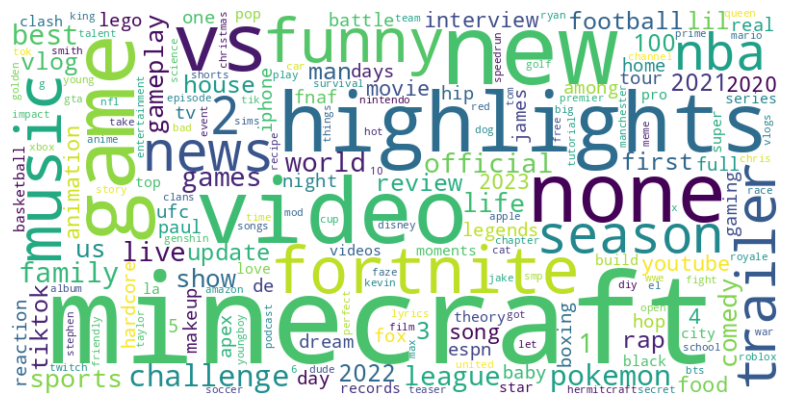



Word Cloud for 'Description':


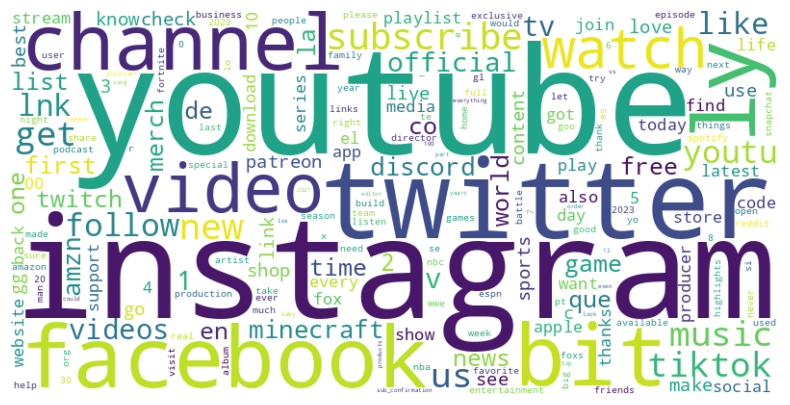

In [ ]:
from wordcloud import WordCloud

# generate a word cloud
def generate_word_cloud(word_counts):
    word_dict = dict(word_counts)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_dict)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

print("Word Cloud for 'Tags':")
generate_word_cloud(common_tags)

print()
print()

print("Word Cloud for 'Description':")
generate_word_cloud(common_description)

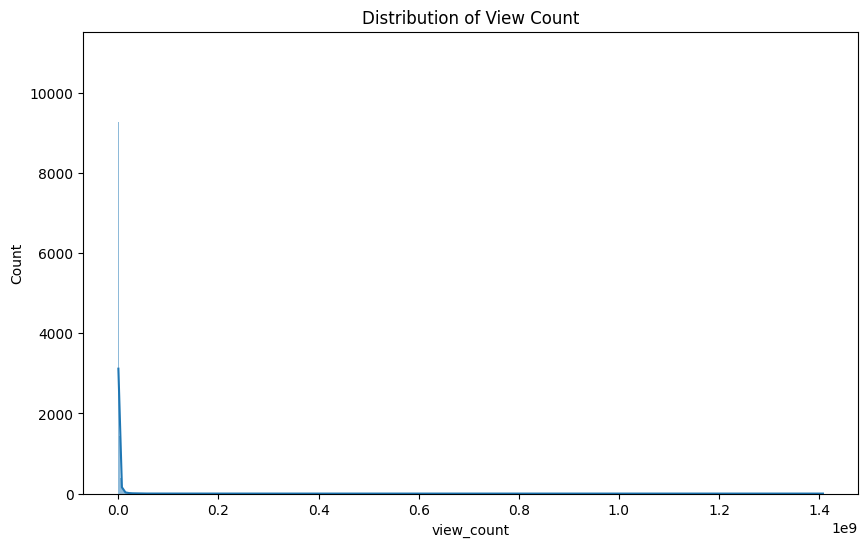

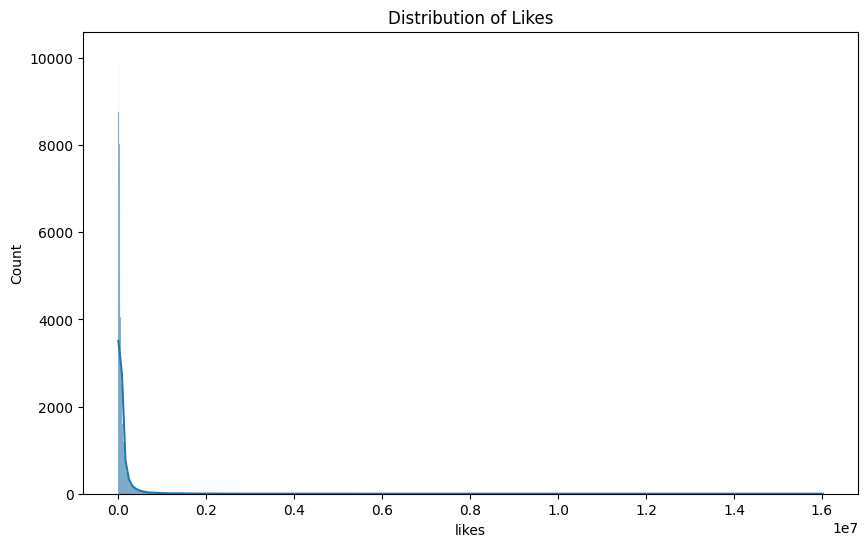

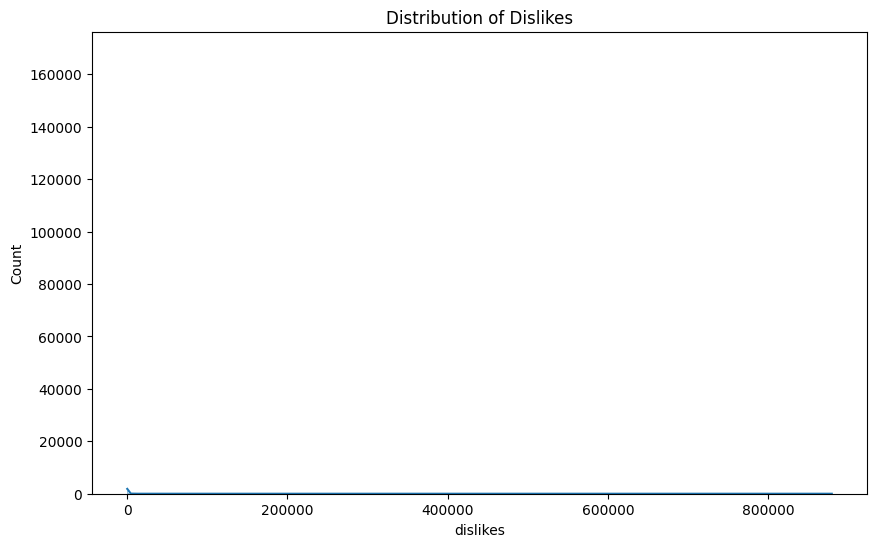

In [ ]:
# Distribution of view_count
plt.figure(figsize=(10, 6))
sns.histplot(df['view_count'], kde=True)
plt.title('Distribution of View Count')
plt.show()

# Distribution of likes
plt.figure(figsize=(10, 6))
sns.histplot(df['likes'], kde=True)
plt.title('Distribution of Likes')
plt.show()

# youtube removes dislikes end of 2021
# Distribution of dislikes
plt.figure(figsize=(10, 6))
sns.histplot(df['dislikes'], kde=True)
plt.title('Distribution of Dislikes')
plt.show()

In [ ]:
df_without_outliers = df[~df.video_id.isin(z_anomalies_df.video_id)]
df_without_outliers.reset_index(inplace=True)
df_without_outliers

,index,video_id,title,publishedAt,channelId,channelTitle,category_name,categoryId,trending_date,tags,...,description,publishedAt_year,publishedAt_month,publishedAt_date,publishedAt_time,trendingDate_year,trendingDate_month,trendingDate_date,tags_words,description_words
0,0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11 19:20:14+00:00,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,Videoblogging,22,2020-08-12 00:00:00+00:00,brawadis|prank|basketball|skits|ghost|funny vi...,...,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,2020,8,11,19:20:14,2020,8,12,"[brawadis, prank, basketball, skits, ghost, fu...","[subscribe, brawadis, bit, ly, subscribetobraw..."
1,1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11 17:00:10+00:00,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,Gaming,20,2020-08-12 00:00:00+00:00,Apex Legends|Apex Legends characters|new Apex ...,...,"While running her own modding shop, Ramya Pare...",2020,8,11,17:00:10,2020,8,12,"[apex, legends, apex, legends, characters, new...","[running, modding, shop, ramya, parekh, aka, r..."
2,2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11 16:34:06+00:00,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,Entertainment,24,2020-08-12 00:00:00+00:00,jacksepticeye|funny|funny meme|memes|jacksepti...,...,I left youtube for a month and this is what ha...,2020,8,11,16:34:06,2020,8,12,"[jacksepticeye, funny, funny, meme, memes, jac...","[left, youtube, month, happenedmy, coffee, com..."
3,3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11 16:38:55+00:00,UCbg_UMjlHJg_19SZckaKajg,XXL,Music,10,2020-08-12 00:00:00+00:00,xxl freshman|xxl freshmen|2020 xxl freshman|20...,...,Subscribe to XXL → http://bit.ly/subscribe-xxl...,2020,8,11,16:38:55,2020,8,12,"[xxl, freshman, xxl, freshmen, 2020, xxl, fres...","[subscribe, xxl, bit, ly, subscribe, xxl, xxl,..."
4,4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11 15:10:05+00:00,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,Howto & Style,26,2020-08-12 00:00:00+00:00,The LaBrant Family|DIY|Interior Design|Makeove...,...,Transforming The LaBrant Family's empty white ...,2020,8,11,15:10:05,2020,8,12,"[labrant, family, diy, interior, design, makeo...","[transforming, labrant, family, empty, white, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258177,264150,4-uXvx5M7XA,Total solar eclipse causing tourism boost acro...,2024-04-08 15:55:44+00:00,UClwddNv0Cr6SIEGkzVK886w,FOX 9 Minneapolis-St. Paul,News & Politics,25,2024-04-15 00:00:00+00:00,morning-news|Eclipses|travel|travel news|weath...,...,Millions of people in the United States are tr...,2024,4,8,15:55:44,2024,4,15,"[morning, news, eclipses, travel, travel, news...","[millions, people, united, states, traveling, ..."
258178,264151,aFsfJYWpqII,Food Delivery Apps: Last Week Tonight with Joh...,2024-04-04 11:00:02+00:00,UC3XTzVzaHQEd30rQbuvCtTQ,LastWeekTonight,Entertainment,24,2024-04-15 00:00:00+00:00,[None],...,"John Oliver discusses food delivery apps, how ...",2024,4,4,11:00:02,2024,4,15,[none],"[john, oliver, discusses, food, delivery, apps..."
258179,264152,pRAsQss17xs,12 Things NO-ONE Tells You About Japan | Feat....,2024-04-07 14:53:25+00:00,UCHL9bfHTxCMi-7vfxQ-AYtg,Abroad in Japan,Entertainment,24,2024-04-15 00:00:00+00:00,japan|cdawgva|abroad in japan|trash taste,...,We reveal 12 things no-one tells you to expect...,2024,4,7,14:53:25,2024,4,15,"[japan, cdawgva, abroad, japan, trash, taste]","[reveal, 12, things, one, tells, expect, japan..."
258180,264153,84QeCD7y_Ds,Buying My Dream Car At 21,2024-04-07 18:00:03+00:00,UChQ-d14tHB62nskossxO0tw,Joe Fazer,Entertainment,24,2024-04-15 00:00:00+00:00,gym|youtube|bodybuilder|powerlifter|vlog|vlogg...,...,Use code JOE at checkout to get discounts on M...,2024,4,7,18:00:03,2024,4,15,"[gym, youtube, bodybuilder, powerlifter, vlog,...","[use, code, joe, checkout, get, discounts, myp..."


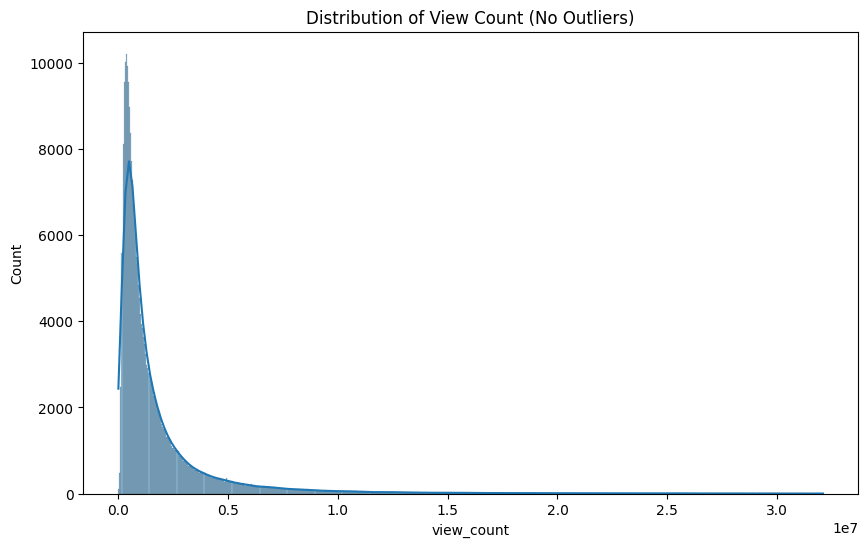

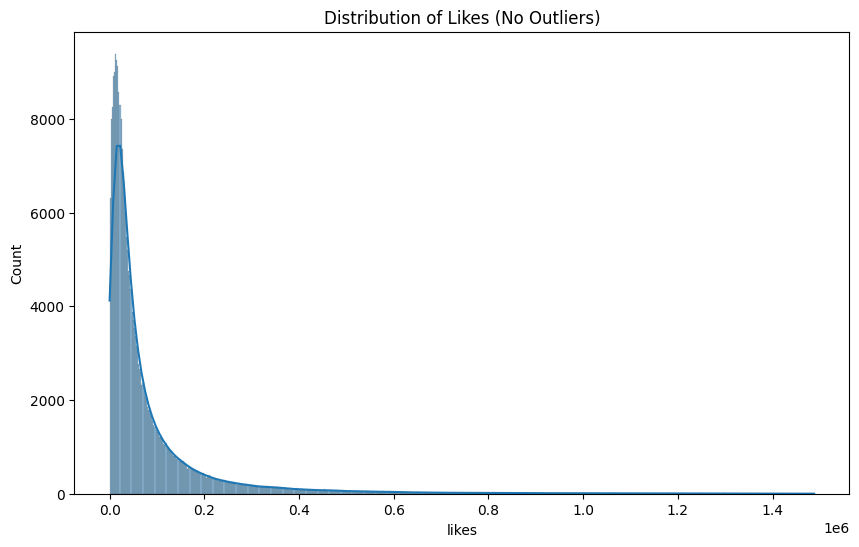

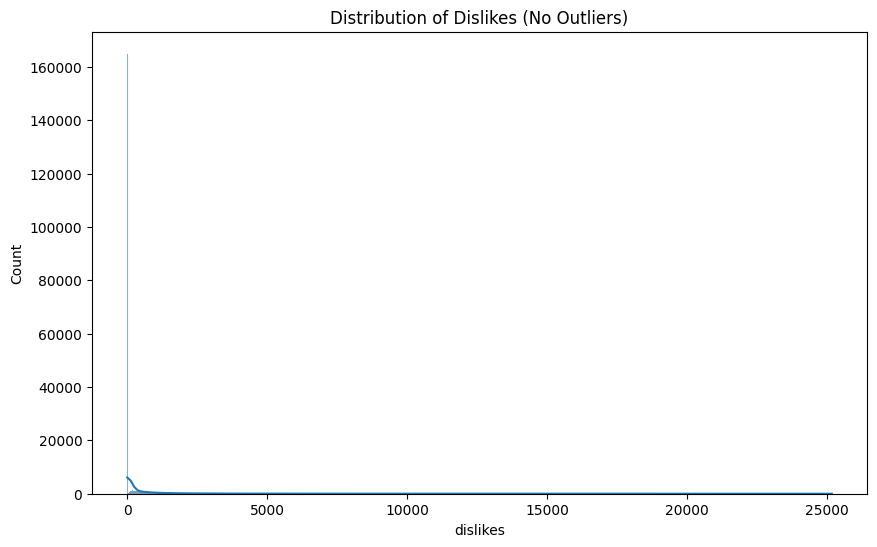

In [ ]:
# Distribution of view_count
plt.figure(figsize=(10, 6))
sns.histplot(df_without_outliers['view_count'], kde=True)
plt.title('Distribution of View Count (No Outliers)')
plt.show()

# Distribution of likes
plt.figure(figsize=(10, 6))
sns.histplot(df_without_outliers['likes'], kde=True)
plt.title('Distribution of Likes (No Outliers)')
plt.show()

# Distribution of dislikes
plt.figure(figsize=(10, 6))
sns.histplot(df_without_outliers['dislikes'], kde=True)
plt.title('Distribution of Dislikes (No Outliers)')
plt.show()

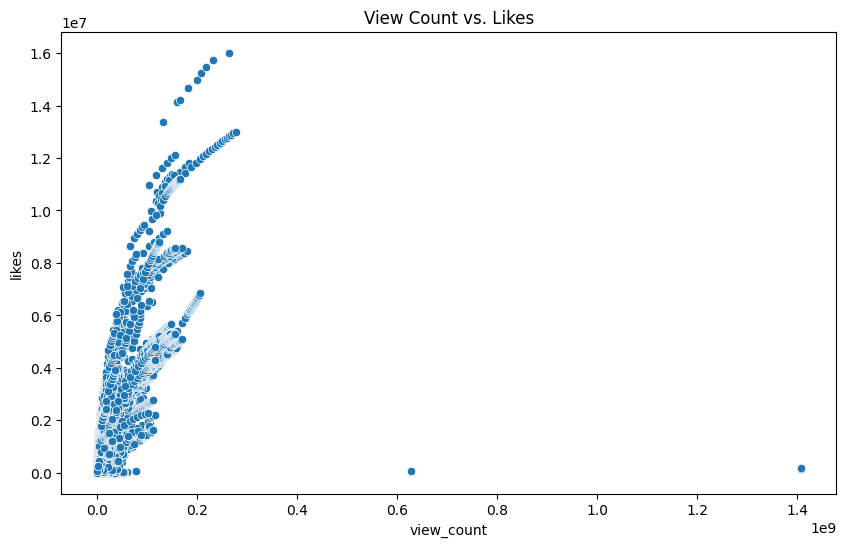

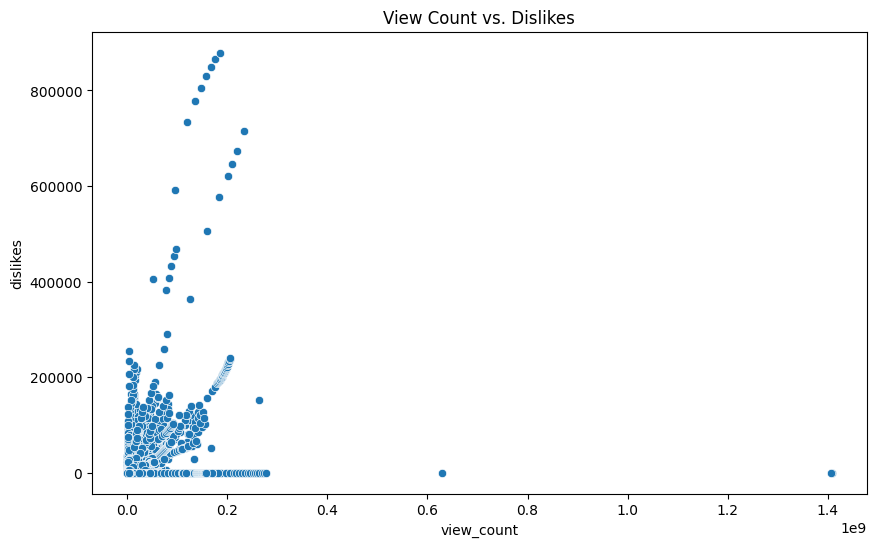

In [ ]:
# Scatter plot of view_count vs. likes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='view_count', y='likes', data=df)
plt.title('View Count vs. Likes')
plt.show()

# Scatter plot of view_count vs. dislikes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='view_count', y='dislikes', data=df)
plt.title('View Count vs. Dislikes')
plt.show()

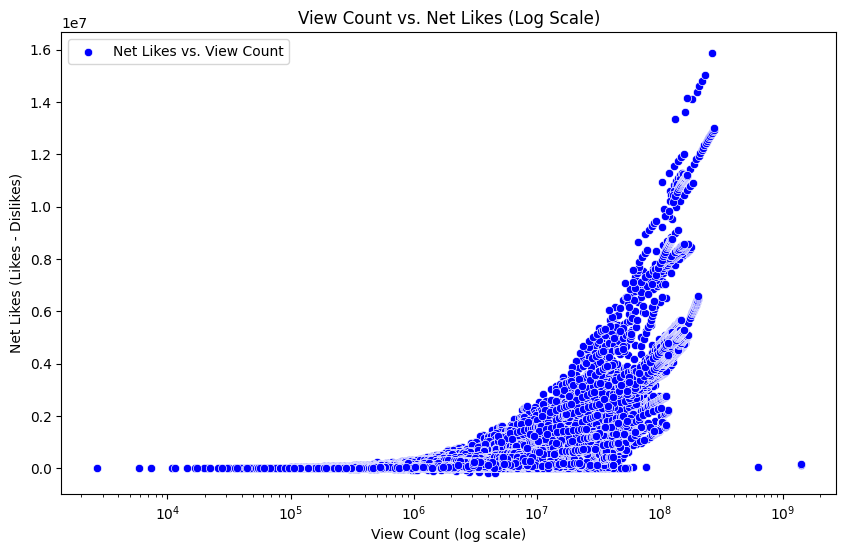

In [ ]:
# Scatter plot for view_count vs. net_likes with Logarithmic scale
df['net_likes'] = df['likes'] - df['dislikes']
plt.figure(figsize=(10, 6))

sns.scatterplot(x='view_count', y='net_likes', data=df, color='blue', label='Net Likes vs. View Count')

# set the x-axis to logarithmic scale
plt.xscale('log')
max_val = max(df['view_count'].max(), df['net_likes'].max())
plt.title('View Count vs. Net Likes (Log Scale)')
plt.xlabel('View Count (log scale)')
plt.ylabel('Net Likes (Likes - Dislikes)')
plt.legend()
plt.show()

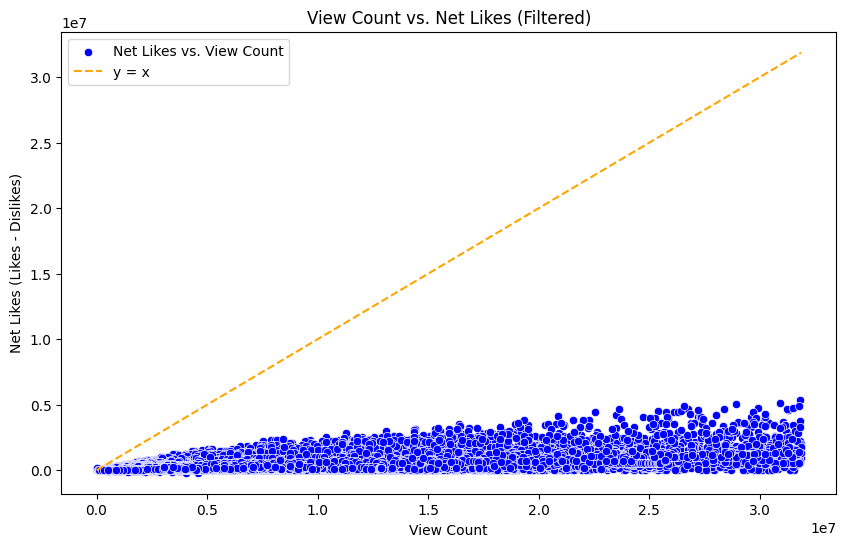

In [ ]:
# Scatter plot for view_count vs. net_likes excluding top 1% outliers

# filter out extreme outliers
threshold = np.percentile(df['view_count'], 99)  # top 1% are considered outliers
filtered_df = df[df['view_count'] < threshold]

plt.figure(figsize=(10, 6))
sns.scatterplot(x='view_count', y='net_likes', data=filtered_df, color='blue', label='Net Likes vs. View Count')
plt.plot([filtered_df['view_count'].min(), filtered_df['view_count'].max()], [filtered_df['view_count'].min(), filtered_df['view_count'].max()], linestyle='--', color='orange', label='y = x')
plt.title('View Count vs. Net Likes (Filtered)')
plt.xlabel('View Count')
plt.ylabel('Net Likes (Likes - Dislikes)')
plt.legend()
plt.show()


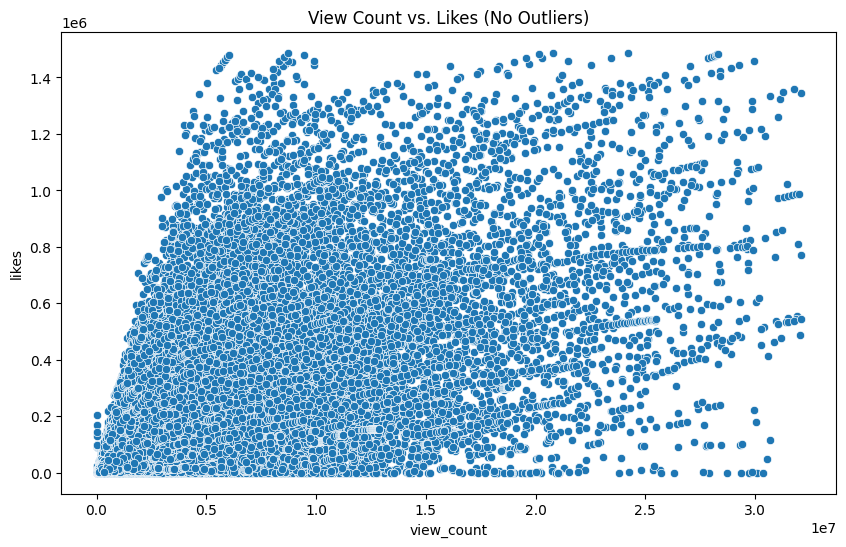

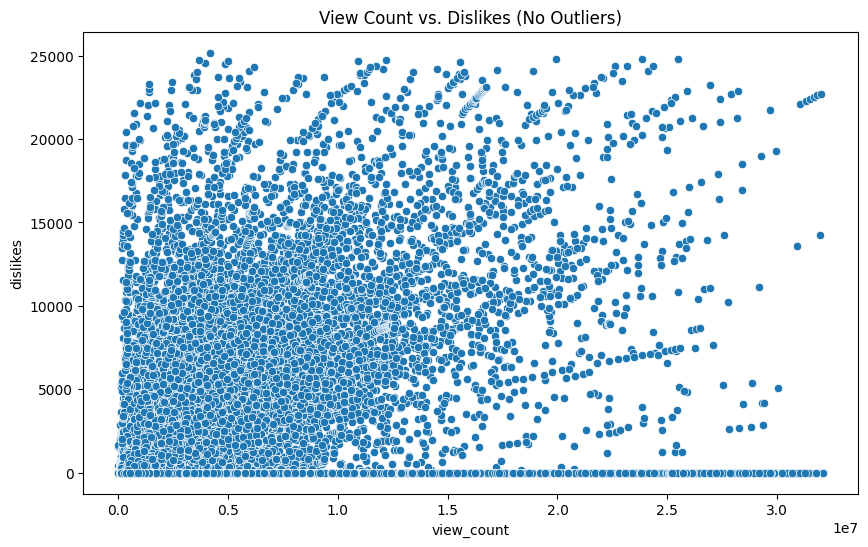

In [ ]:
# Scatter plot of view_count vs. likes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='view_count', y='likes', data=df_without_outliers)
plt.title('View Count vs. Likes (No Outliers)')
plt.show()

# Scatter plot of view_count vs. dislikes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='view_count', y='dislikes', data=df_without_outliers)
plt.title('View Count vs. Dislikes (No Outliers)')
plt.show()

In [ ]:
df.loc[df['view_count'].idxmax()]

# https://www.youtube.com/watch?v=cc2-4ci4G84
# ^ originally had 1.4 billion views because it was played each time discord was opened -> yt mass removed the views
# (between then-- april 1st 2024-- and now, it has only 3.9m views)

,261580
video_id,cc2-4ci4G84
title,Discord Loot Boxes are here.
publishedAt,2024-04-01 17:46:17+00:00
channelId,UCZ5XnGb-3t7jCkXdawN2tkA
channelTitle,Discord
category_name,Entertainment
categoryId,24
trending_date,2024-04-03 00:00:00+00:00
tags,[None]
view_count,1407643634


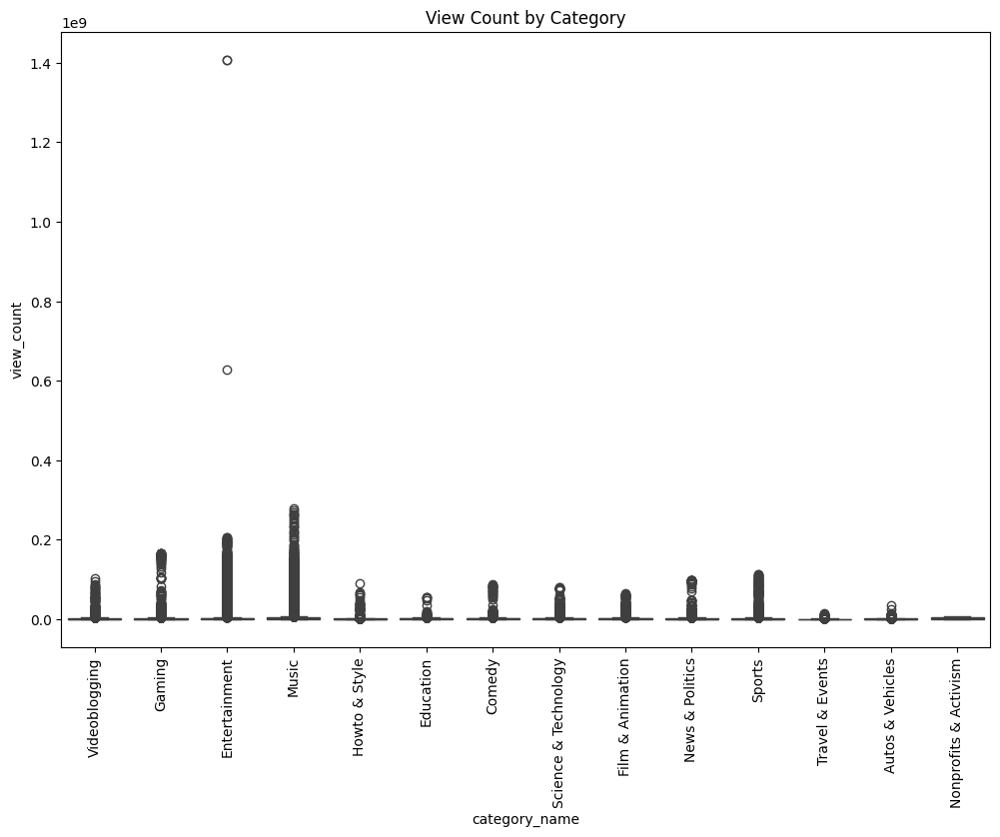

In [ ]:
# Boxplot of view_count across categoryId
plt.figure(figsize=(12, 8))
sns.boxplot(x='category_name', y='view_count', data=df)
plt.title('View Count by Category')
plt.xticks(rotation=90)
plt.show()

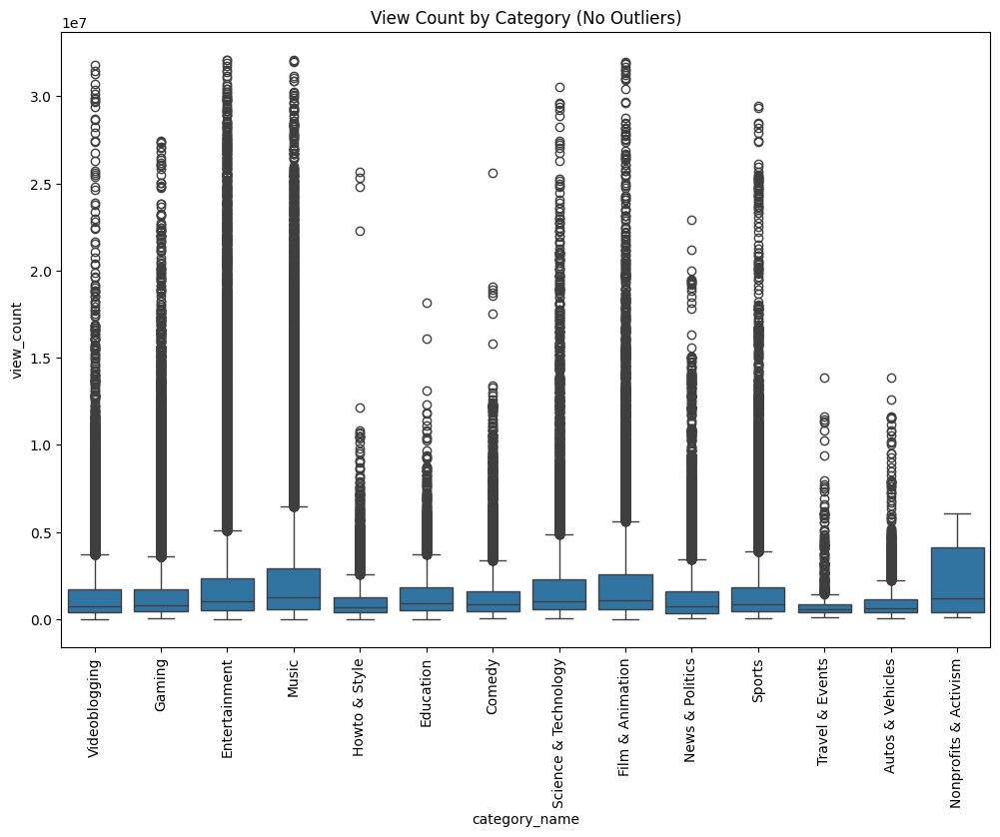

In [ ]:
# Boxplot of view_count across categoryId
plt.figure(figsize=(12, 8))
sns.boxplot(x='category_name', y='view_count', data=df_without_outliers)
plt.title('View Count by Category (No Outliers)')
plt.xticks(rotation=90)
plt.show()

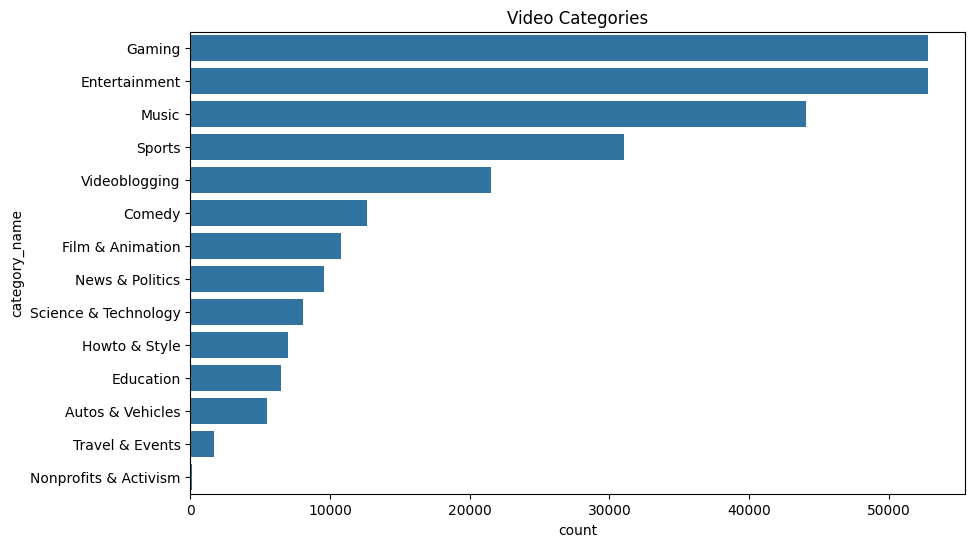

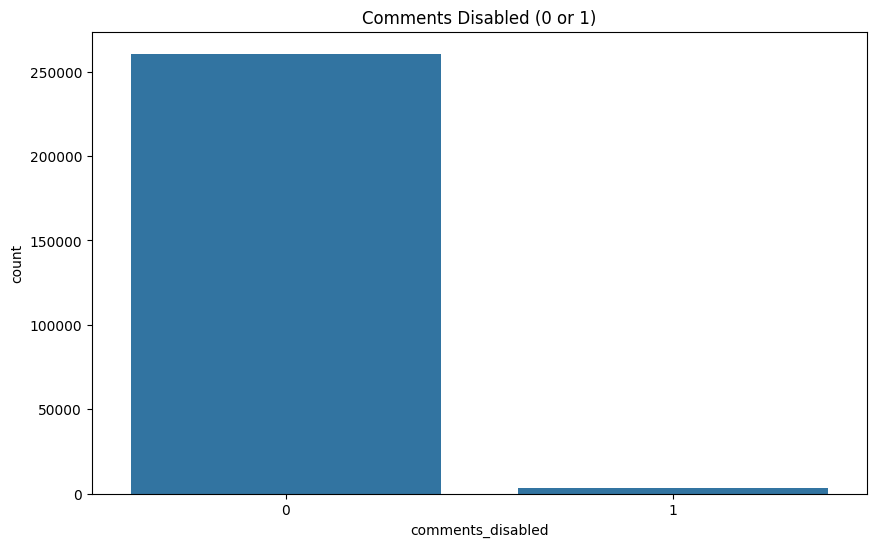

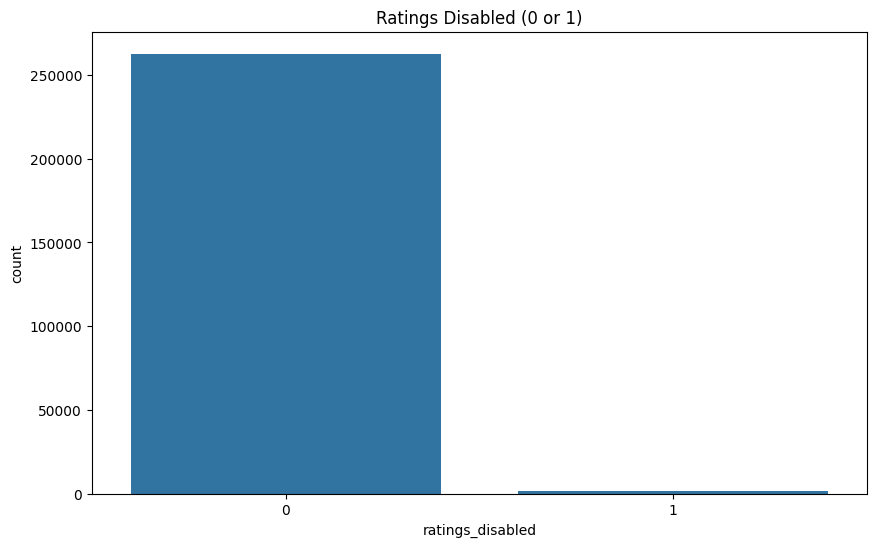

In [ ]:
# Bar plot of categoryId
plt.figure(figsize=(10, 6))
sns.countplot(y='category_name', data=df, order=df['category_name'].value_counts().index)
plt.title('Video Categories')
plt.show()

# Bar plot of comments_disabled
plt.figure(figsize=(10, 6))
sns.countplot(x='comments_disabled', data=df)
plt.title('Comments Disabled (0 or 1)')
plt.show()

# Bar plot of ratings_disabled
plt.figure(figsize=(10, 6))
sns.countplot(x='ratings_disabled', data=df)
plt.title('Ratings Disabled (0 or 1)')
plt.show()

2020-08-03 21:51:14+00:00
2024-04-14 10:00:53+00:00


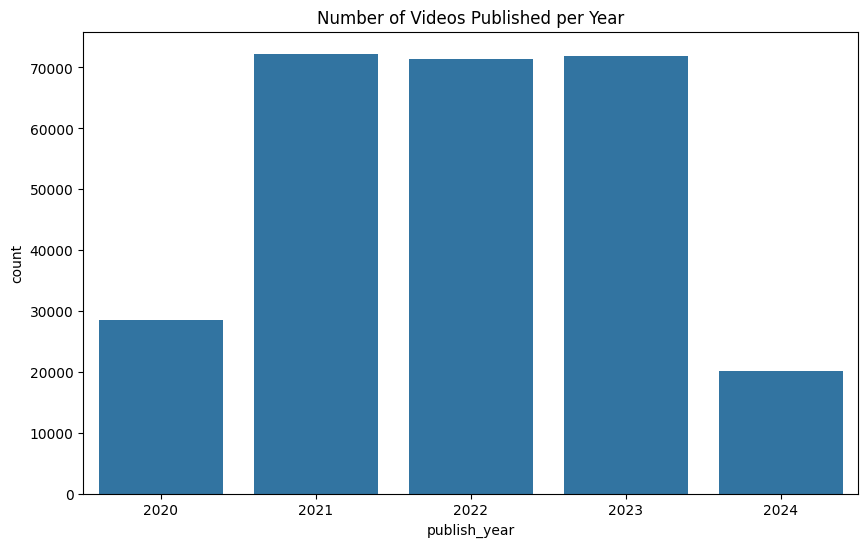

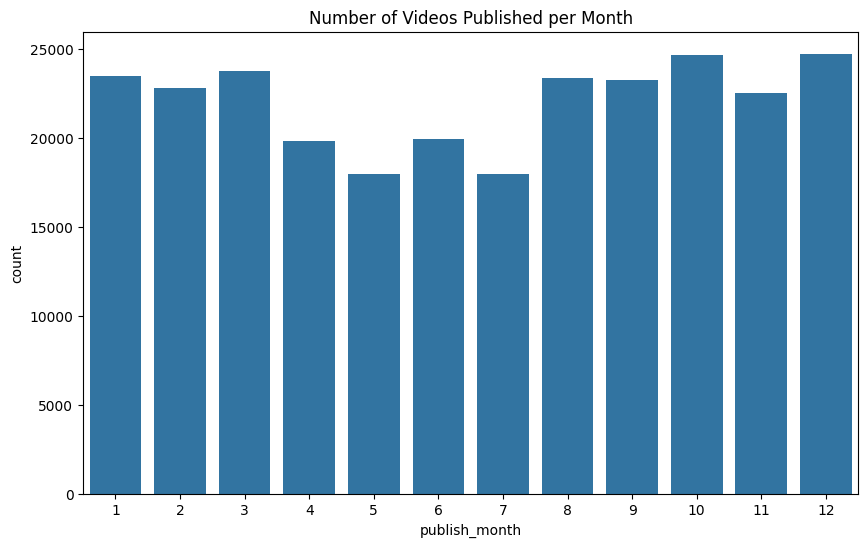

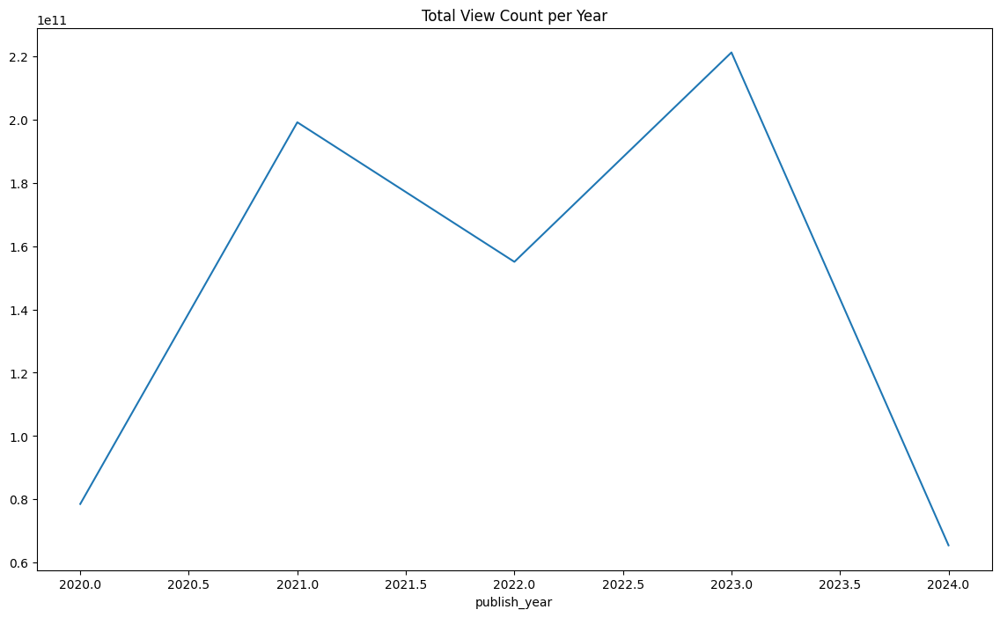

In [ ]:
print(df['publishedAt'].min())
print(df['publishedAt'].max())
# Extract date features
df['publish_year'] = df['publishedAt'].dt.year
df['publish_month'] = df['publishedAt'].dt.month

# Plot the number of videos published per year
plt.figure(figsize=(10, 6))
sns.countplot(x='publish_year', data=df)
plt.title('Number of Videos Published per Year')
plt.show()

# Plot the number of videos published per month
plt.figure(figsize=(10, 6))
sns.countplot(x='publish_month', data=df)
plt.title('Number of Videos Published per Month')
plt.show()

# Plot trends in view_count over time
plt.figure(figsize=(14, 8))
df.groupby('publish_year')['view_count'].sum().plot()
plt.title('Total View Count per Year')
plt.show()

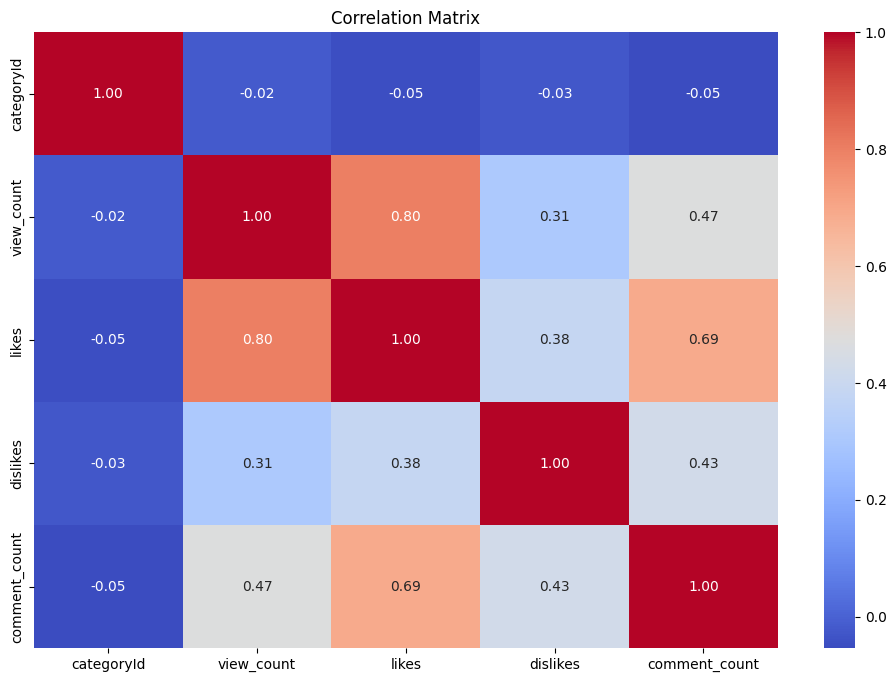

In [ ]:
# Correlation matrix
corr_matrix = df[numerical_cols_to_check].corr()

# Heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


### Week 1 & 2 Recommended Deliverables:

1. Project Docs: Scope and deliverables
2. Jupyter Notebook: Data preprocessing steps, including code for cleaning and transforming the data
3. **TODO |** Markdown File: Summary of the data issues encountered and how they were addressed (to be submitted at the end of Week 2)

### Week 3 & 4 Recommended Deliverables:
1. Jupyter Notebook: EDA process, including code, visualizations, and insights
2. **TODO |** PowerPoint Slides: Key findings and potential features (to be presented internally at the end of Week 4)

In [ ]:
df.sort_values(by='view_count', ascending=False).head(40)

,video_id,title,publishedAt,channelId,channelTitle,category_name,categoryId,trending_date,tags,view_count,...,publishedAt_date,publishedAt_time,trendingDate_year,trendingDate_month,trendingDate_date,tags_words,description_words,net_likes,publish_year,publish_month
261580,cc2-4ci4G84,Discord Loot Boxes are here.,2024-04-01 17:46:17+00:00,UCZ5XnGb-3t7jCkXdawN2tkA,Discord,Entertainment,24,2024-04-03 00:00:00+00:00,[None],1407643634,...,1,17:46:17,2024,4,3,[none],"[would, ever, bring, loot, boxes, chat, appope...",126926,2024,4
261780,cc2-4ci4G84,Discord Loot Boxes are here.,2024-04-01 17:46:17+00:00,UCZ5XnGb-3t7jCkXdawN2tkA,Discord,Entertainment,24,2024-04-04 00:00:00+00:00,[None],1406329649,...,1,17:46:17,2024,4,4,[none],"[would, ever, bring, loot, boxes, chat, appope...",165173,2024,4
261381,cc2-4ci4G84,Discord Loot Boxes are here.,2024-04-01 17:46:17+00:00,UCZ5XnGb-3t7jCkXdawN2tkA,Discord,Entertainment,24,2024-04-02 00:00:00+00:00,[None],628718636,...,1,17:46:17,2024,4,2,[none],"[would, ever, bring, loot, boxes, chat, appope...",47460,2024,4
148961,gQlMMD8auMs,BLACKPINK - ‘Pink Venom’ M/V,2022-08-19 04:00:13+00:00,UCOmHUn--16B90oW2L6FRR3A,BLACKPINK,Music,10,2022-09-10 00:00:00+00:00,YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...,277791741,...,19,04:00:13,2022,9,10,"[yg, entertainment, yg, 와이지, k, pop, blackpink...","[blackpink, pink, venom, vkick, door, waving, ...",12993894,2022,8
148745,gQlMMD8auMs,BLACKPINK - ‘Pink Venom’ M/V,2022-08-19 04:00:13+00:00,UCOmHUn--16B90oW2L6FRR3A,BLACKPINK,Music,10,2022-09-09 00:00:00+00:00,YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...,273162966,...,19,04:00:13,2022,9,9,"[yg, entertainment, yg, 와이지, k, pop, blackpink...","[blackpink, pink, venom, vkick, door, waving, ...",12937252,2022,8
148546,gQlMMD8auMs,BLACKPINK - ‘Pink Venom’ M/V,2022-08-19 04:00:13+00:00,UCOmHUn--16B90oW2L6FRR3A,BLACKPINK,Music,10,2022-09-08 00:00:00+00:00,YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...,268758295,...,19,04:00:13,2022,9,8,"[yg, entertainment, yg, 와이지, k, pop, blackpink...","[blackpink, pink, venom, vkick, door, waving, ...",12882841,2022,8
148360,gQlMMD8auMs,BLACKPINK - ‘Pink Venom’ M/V,2022-08-19 04:00:13+00:00,UCOmHUn--16B90oW2L6FRR3A,BLACKPINK,Music,10,2022-09-07 00:00:00+00:00,YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...,264459017,...,19,04:00:13,2022,9,7,"[yg, entertainment, yg, 와이지, k, pop, blackpink...","[blackpink, pink, venom, vkick, door, waving, ...",12829059,2022,8
55800,WMweEpGlu_U,BTS (방탄소년단) 'Butter' Official MV,2021-05-21 03:46:13+00:00,UC3IZKseVpdzPSBaWxBxundA,HYBE LABELS,Music,10,2021-05-30 00:00:00+00:00,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,264407389,...,21,03:46:13,2021,5,30,"[bighit, 빅히트, 방탄소년단, bts, bangtan, 방탄]","[bts, 방탄소년단, butter, official, mv, credits, di...",15870545,2021,5
148156,gQlMMD8auMs,BLACKPINK - ‘Pink Venom’ M/V,2022-08-19 04:00:13+00:00,UCOmHUn--16B90oW2L6FRR3A,BLACKPINK,Music,10,2022-09-06 00:00:00+00:00,YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...,260126694,...,19,04:00:13,2022,9,6,"[yg, entertainment, yg, 와이지, k, pop, blackpink...","[blackpink, pink, venom, vkick, door, waving, ...",12773474,2022,8
147965,gQlMMD8auMs,BLACKPINK - ‘Pink Venom’ M/V,2022-08-19 04:00:13+00:00,UCOmHUn--16B90oW2L6FRR3A,BLACKPINK,Music,10,2022-09-05 00:00:00+00:00,YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...,255524865,...,19,04:00:13,2022,9,5,"[yg, entertainment, yg, 와이지, k, pop, blackpink...","[blackpink, pink, venom, vkick, door, waving, ...",12715882,2022,8


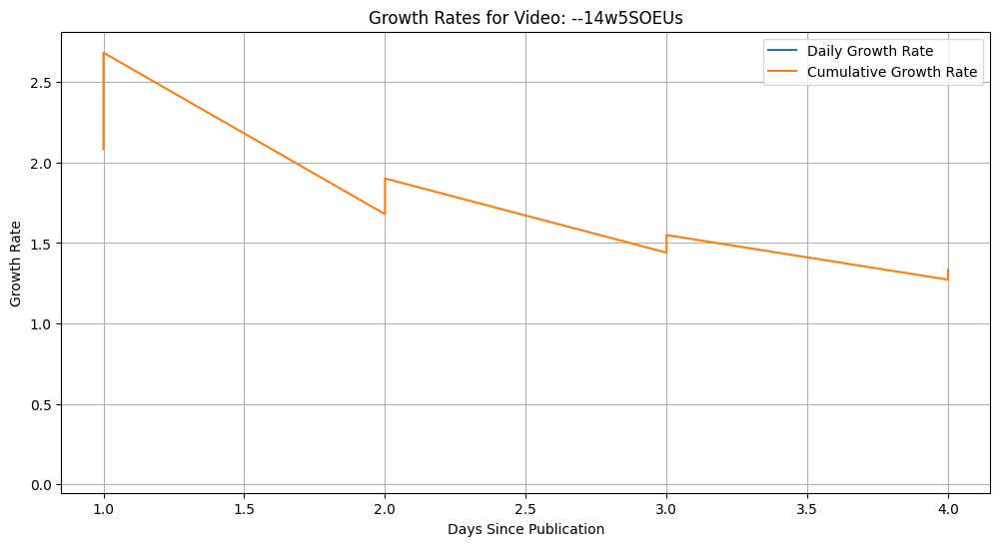

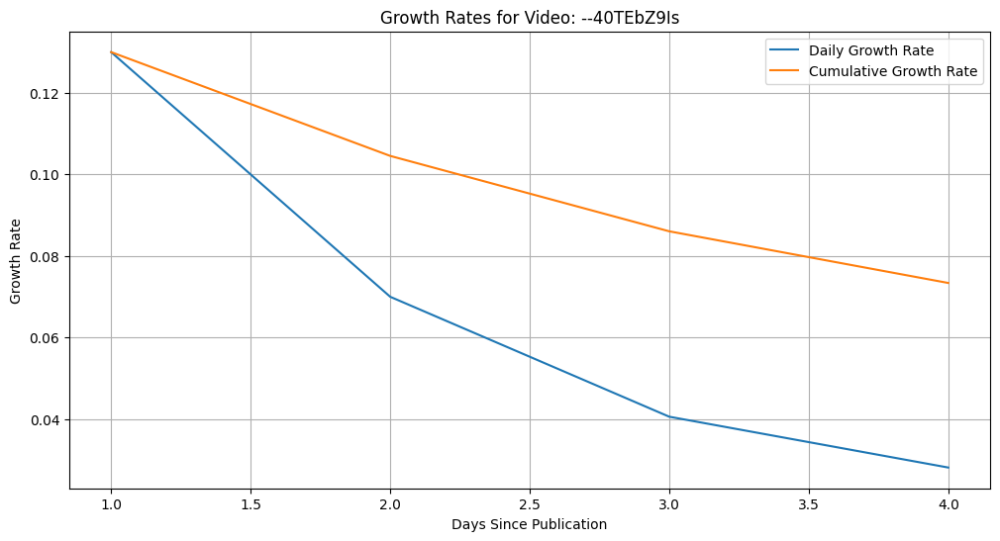

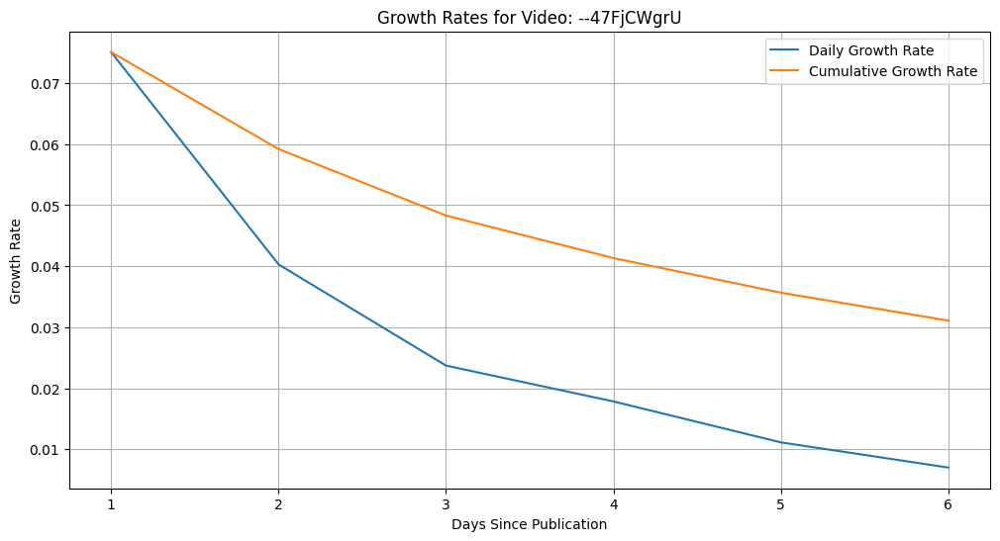

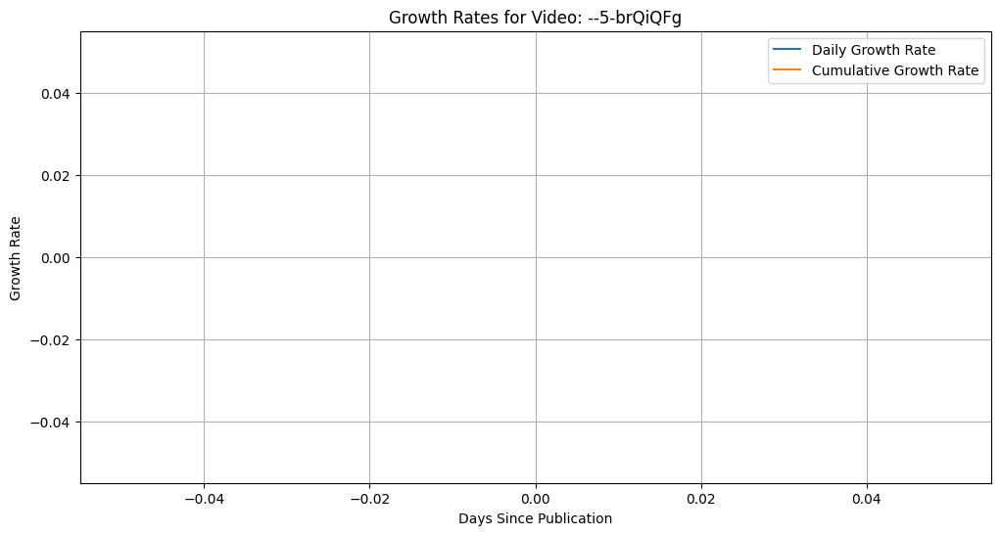

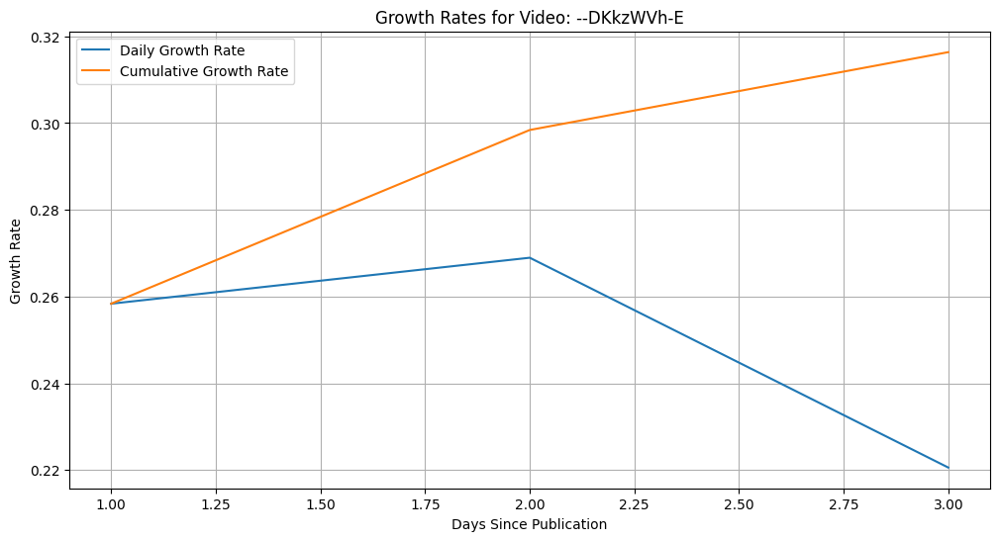

...

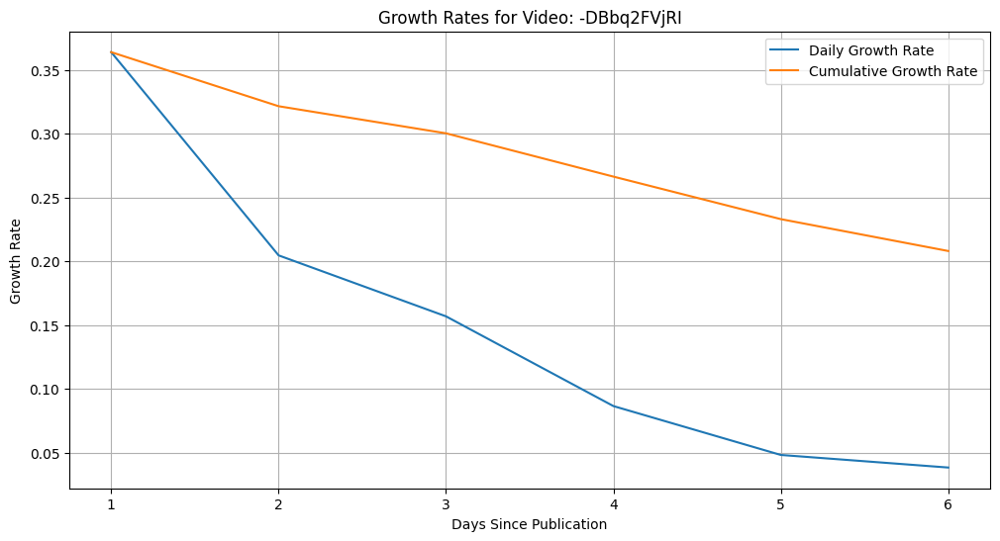

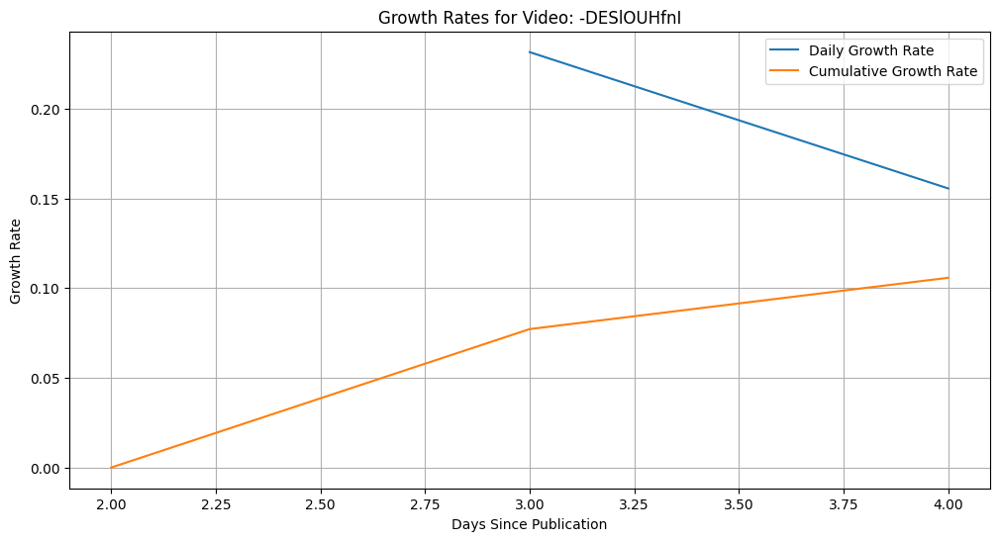

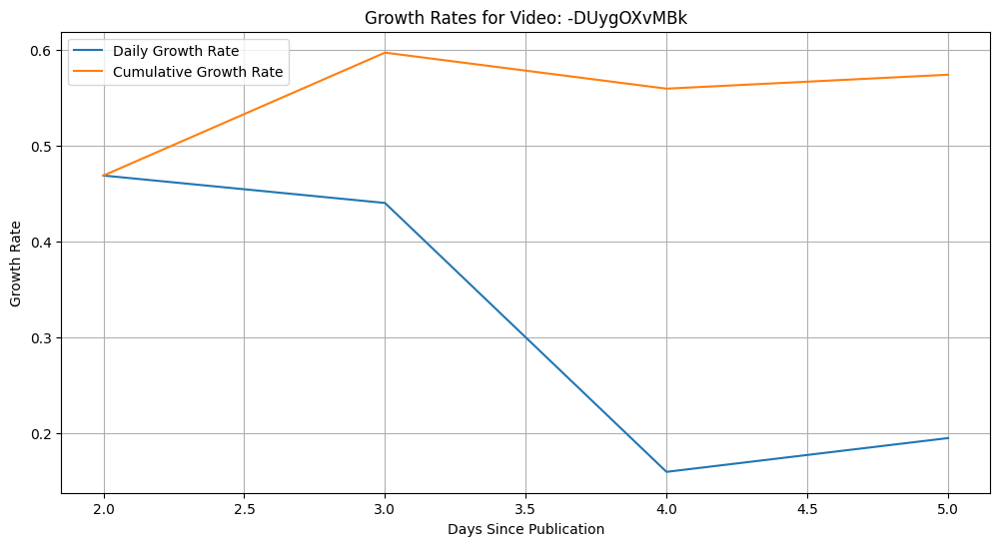

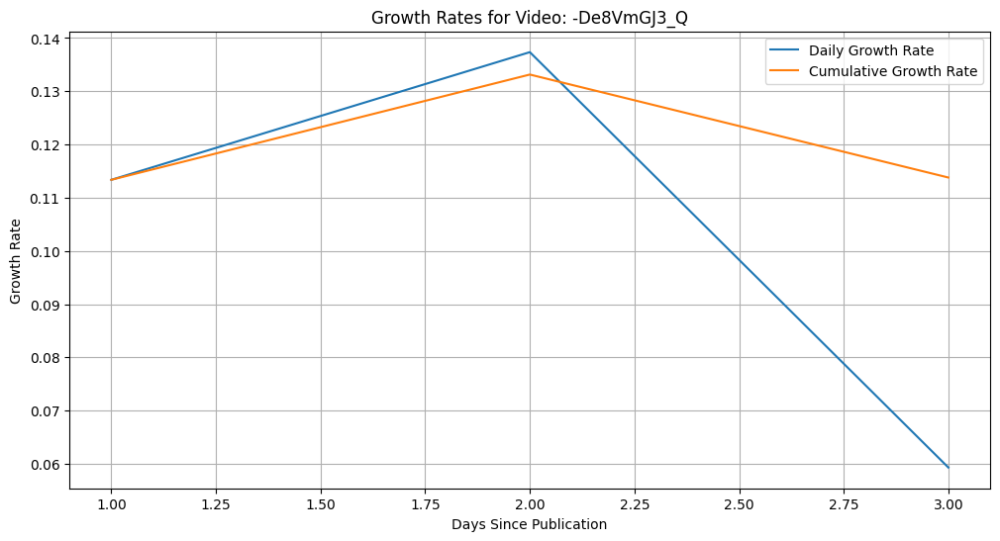

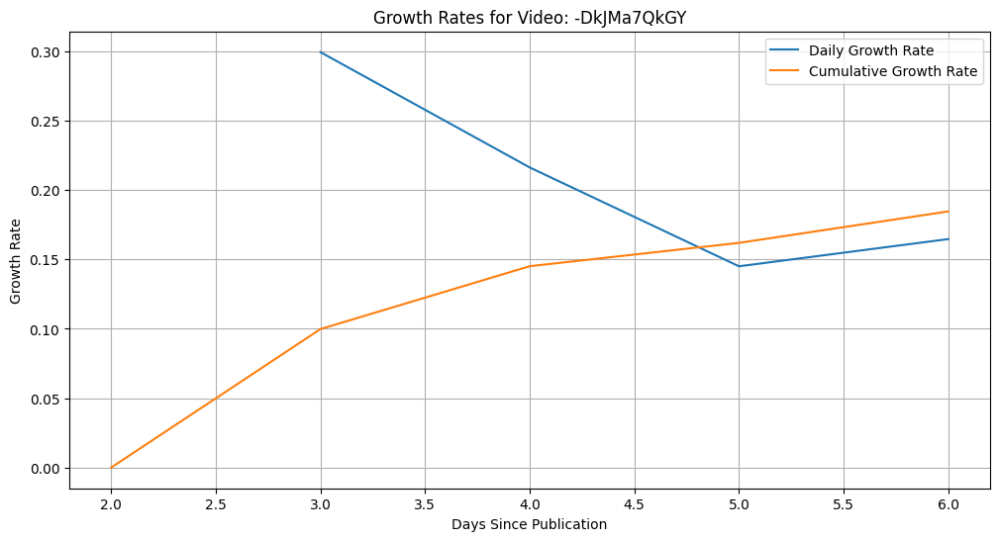

KeyboardInterrupt: 

<Figure size 1200x600 with 0 Axes>

In [ ]:
df['trending_date'] = pd.to_datetime(df['trending_date'])
df['publishedAt'] = pd.to_datetime(df['publishedAt'])
df['days_since_publication'] = (df['trending_date'] - df['publishedAt']).dt.days
df_sorted = df.sort_values(['video_id', 'days_since_publication'])
df_sorted['daily_growth_rate'] = df_sorted.groupby('video_id')['view_count'].pct_change() / df_sorted.groupby('video_id')['days_since_publication'].diff()
df_sorted['cumulative_growth_rate'] = (df_sorted['view_count'] / df_sorted.groupby('video_id')['view_count'].transform('first') - 1) / df_sorted['days_since_publication']

def plot_video_growth(video_id):
    video_data = df_sorted[df_sorted['video_id'] == video_id]

    plt.figure(figsize=(12, 6))
    plt.plot(video_data['days_since_publication'], video_data['daily_growth_rate'], label='Daily Growth Rate')
    plt.plot(video_data['days_since_publication'], video_data['cumulative_growth_rate'], label='Cumulative Growth Rate')

    plt.title(f"Growth Rates for Video: {video_id}")
    plt.xlabel("Days Since Publication")
    plt.ylabel("Growth Rate")
    plt.legend()
    plt.grid(True)
    plt.show()

for video_id in df_sorted['video_id'].unique():
    plot_video_growth(video_id)

avg_growth_rates = df_sorted.groupby('video_id').agg({
    'daily_growth_rate': 'mean',
    'cumulative_growth_rate': 'mean',
    'view_count': 'max',
    'title': 'first'
}).sort_values('cumulative_growth_rate', ascending=False)

print("Top 10 Videos by Cumulative Growth Rate:")
print(avg_growth_rates[['title', 'cumulative_growth_rate', 'view_count']].head(10))

plt.figure(figsize=(12, 6))
for video_id in df_sorted['video_id'].unique():
    video_data = df_sorted[df_sorted['video_id'] == video_id]
    plt.plot(video_data['days_since_publication'], video_data['cumulative_growth_rate'], label=video_id)

plt.title("Cumulative Growth Rates for All Videos")
plt.xlabel("Days Since Publication")
plt.ylabel("Cumulative Growth Rate")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

Summary Statistics for Growth Rates:
       daily_growth_rate  cumulative_growth_rate
count       45681.000000            45681.000000
mean            0.146078                0.230891
std             0.129382                0.378909
min            -0.093916               -0.175698
25%             0.074340                0.071925
50%             0.120444                0.150223
75%             0.184856                0.285472
max             5.786458               28.706905

Top 10 Videos by Cumulative Growth Rate:
                                                         title  \
video_id                                                         
lJ3fkULgtO4  Busta Rhymes - BEACH BALL (Official Music Vide...   
LrtAATC471E  Diplo - Wasted (Official Video) ft. Kodak Blac...   
MbWq-EwUy_M                        Dice Stacks from $1 to $100   
ZmDBbnmKpqQ  Olivia Rodrigo - drivers license (Official Video)   
8CaRIll0cvI               Yella Beezy - HA HA (Official Video)   
5L6juLUkwuw  Tom B

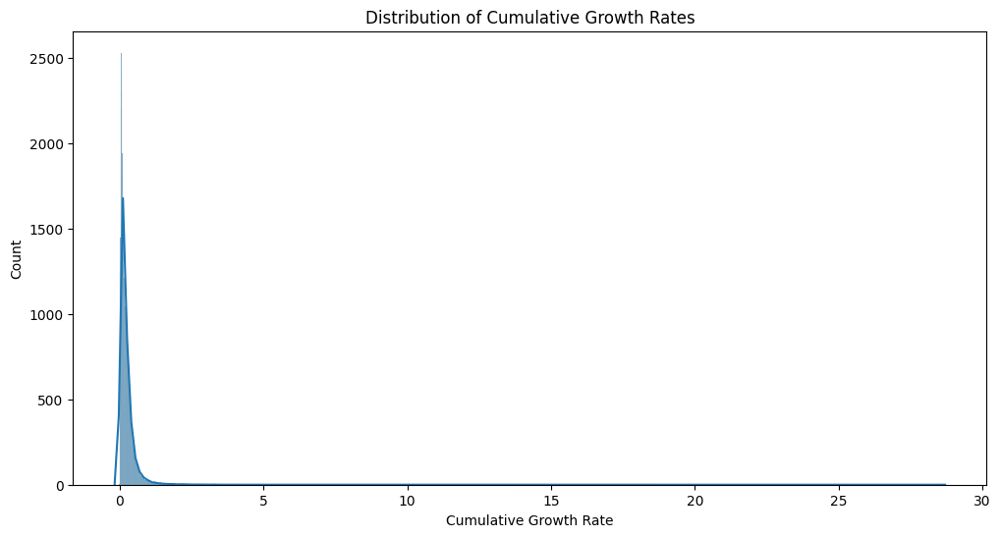

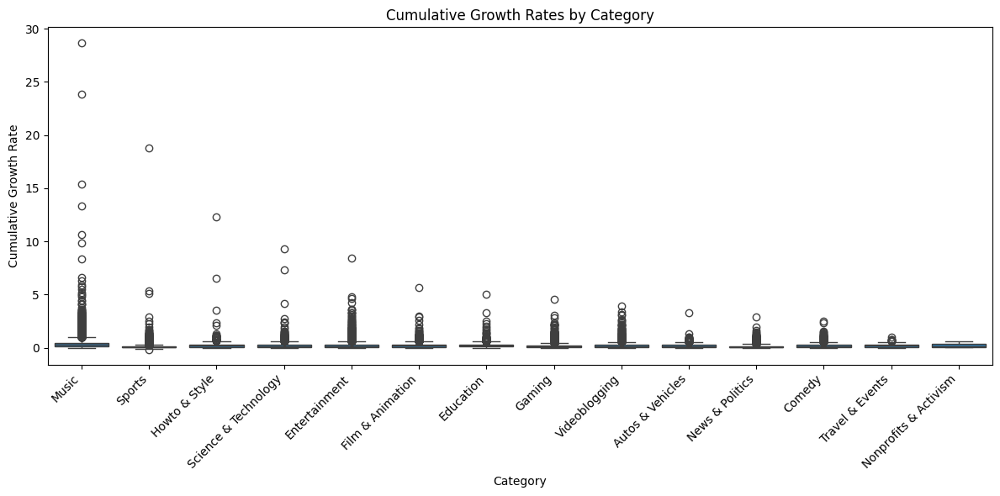

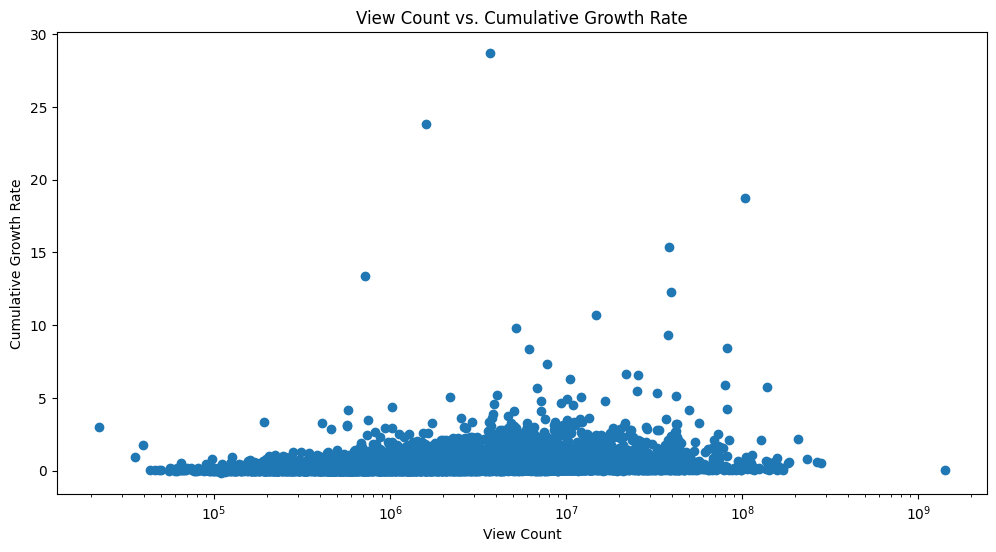

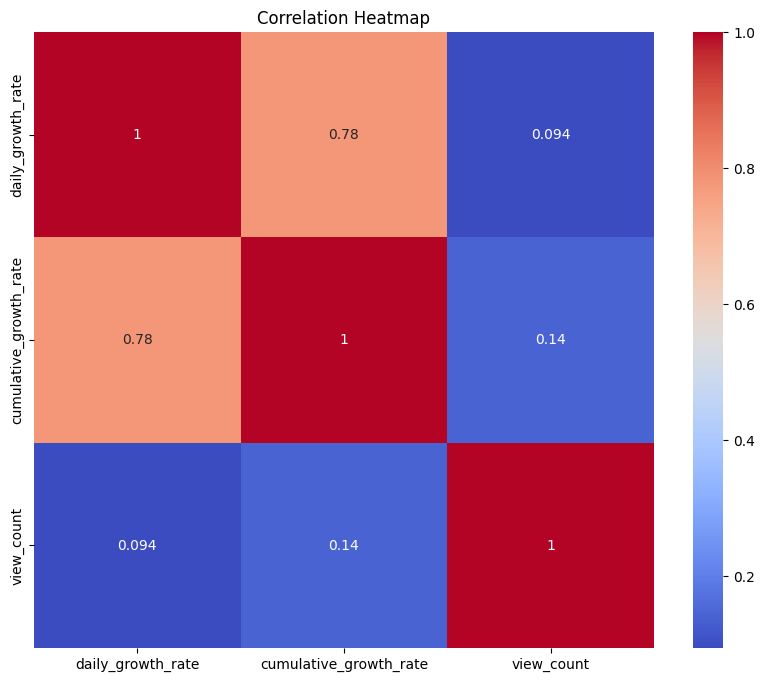

In [ ]:
df['trending_date'] = pd.to_datetime(df['trending_date'])
df['publishedAt'] = pd.to_datetime(df['publishedAt'])
df['days_since_publication'] = (df['trending_date'] - df['publishedAt']).dt.days

df_sorted = df.sort_values(['video_id', 'days_since_publication'])
df_sorted['daily_growth_rate'] = df_sorted.groupby('video_id')['view_count'].pct_change() / df_sorted.groupby('video_id')['days_since_publication'].diff()
df_sorted['cumulative_growth_rate'] = (df_sorted['view_count'] / df_sorted.groupby('video_id')['view_count'].transform('first') - 1) / df_sorted['days_since_publication']
df_sorted['daily_growth_rate'] = df_sorted['daily_growth_rate'].replace([np.inf, -np.inf], np.nan)
df_sorted['cumulative_growth_rate'] = df_sorted['cumulative_growth_rate'].replace([np.inf, -np.inf], np.nan)

avg_growth_rates = df_sorted.groupby('video_id').agg({
    'daily_growth_rate': lambda x: x.mean(skipna=True),
    'cumulative_growth_rate': lambda x: x.mean(skipna=True),
    'view_count': 'max',
    'title': 'first',
    'category_name': 'first'
}).sort_values('cumulative_growth_rate', ascending=False)

avg_growth_rates = avg_growth_rates.dropna(subset=['daily_growth_rate', 'cumulative_growth_rate'])

print("Summary Statistics for Growth Rates:")
print(avg_growth_rates[['daily_growth_rate', 'cumulative_growth_rate']].describe())

print("\nTop 10 Videos by Cumulative Growth Rate:")
print(avg_growth_rates[['title', 'category_name', 'cumulative_growth_rate', 'view_count']].head(10))

plt.figure(figsize=(12, 6))
sns.histplot(avg_growth_rates['cumulative_growth_rate'], kde=True)
plt.title("Distribution of Cumulative Growth Rates")
plt.xlabel("Cumulative Growth Rate")
plt.ylabel("Count")
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='category_name', y='cumulative_growth_rate', data=avg_growth_rates)
plt.title("Cumulative Growth Rates by Category")
plt.xlabel("Category")
plt.ylabel("Cumulative Growth Rate")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
plt.scatter(avg_growth_rates['view_count'], avg_growth_rates['cumulative_growth_rate'])
plt.title("View Count vs. Cumulative Growth Rate")
plt.xlabel("View Count")
plt.ylabel("Cumulative Growth Rate")
plt.xscale('log')
plt.show()

correlation = avg_growth_rates[['daily_growth_rate', 'cumulative_growth_rate', 'view_count']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

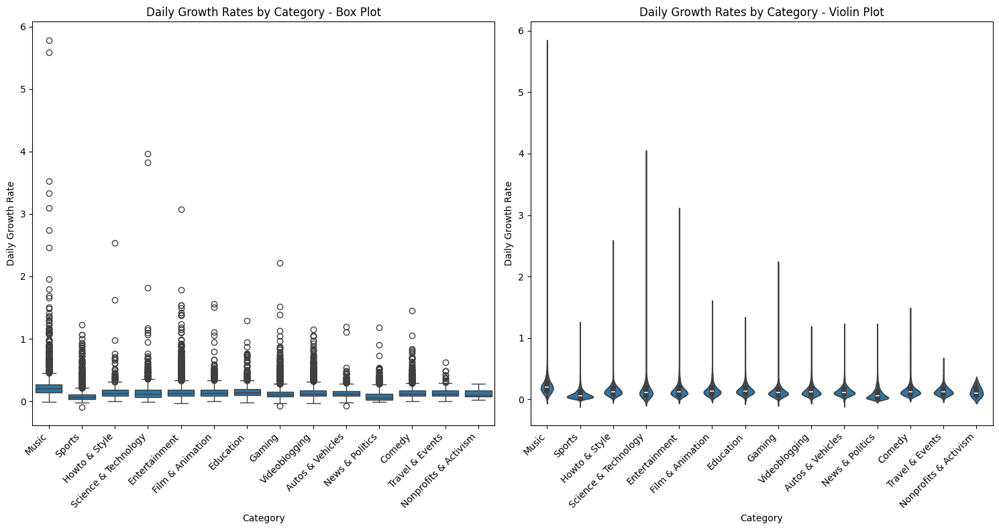

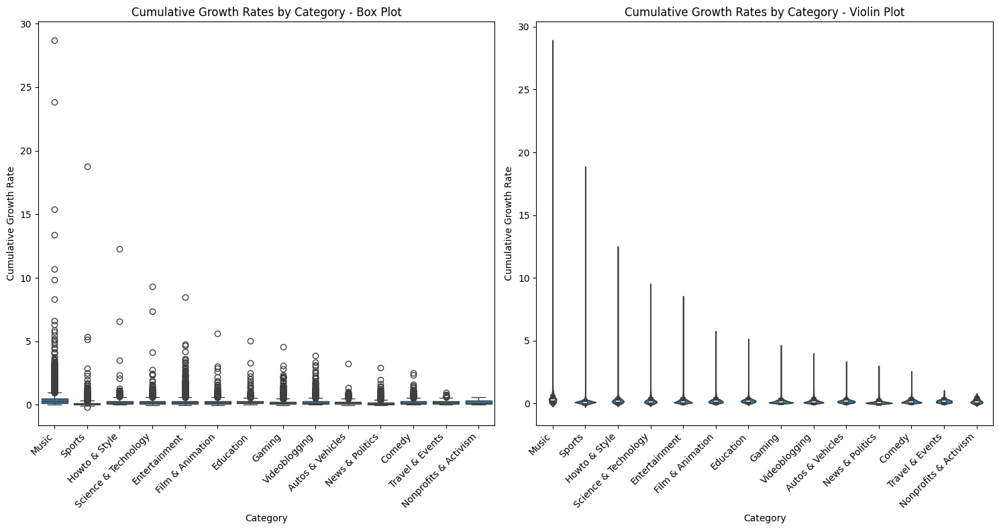

Average Growth Rates by Category:
                       daily_growth_rate  cumulative_growth_rate
category_name                                                   
Music                           0.227095                0.413446
Education                       0.162715                0.250219
Film & Animation                0.152094                0.243738
Science & Technology            0.151708                0.241721
Howto & Style                   0.148098                0.238921
Entertainment                   0.151670                0.235906
Nonprofits & Activism           0.127196                0.215745
Videoblogging                   0.145518                0.210509
Travel & Events                 0.141305                0.209193
Comedy                          0.143259                0.204969
Autos & Vehicles                0.135407                0.203093
Gaming                          0.122489                0.174482
News & Politics                 0.088798                

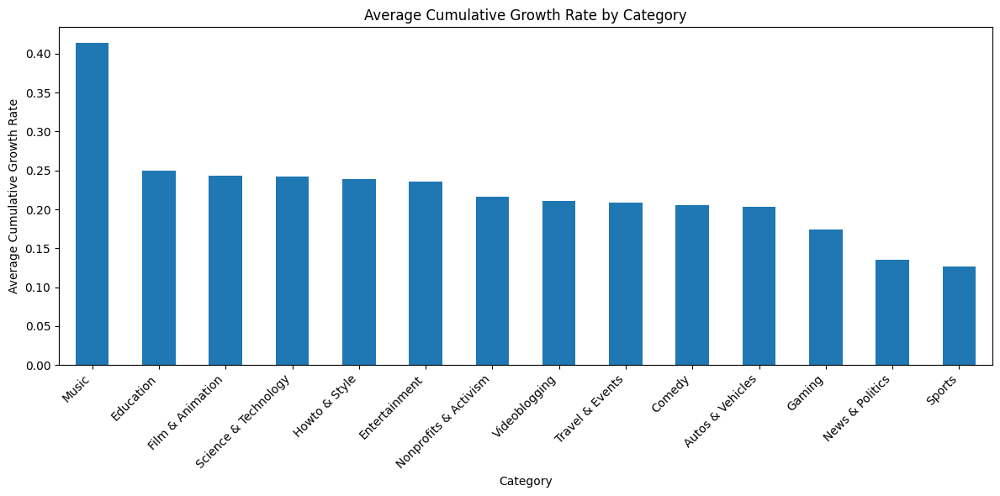

In [ ]:
df['trending_date'] = pd.to_datetime(df['trending_date'])
df['publishedAt'] = pd.to_datetime(df['publishedAt'])
df['days_since_publication'] = (df['trending_date'] - df['publishedAt']).dt.days

df_sorted = df.sort_values(['video_id', 'days_since_publication'])
df_sorted['daily_growth_rate'] = df_sorted.groupby('video_id')['view_count'].pct_change() / df_sorted.groupby('video_id')['days_since_publication'].diff()
df_sorted['cumulative_growth_rate'] = (df_sorted['view_count'] / df_sorted.groupby('video_id')['view_count'].transform('first') - 1) / df_sorted['days_since_publication']
df_sorted['daily_growth_rate'] = df_sorted['daily_growth_rate'].replace([np.inf, -np.inf], np.nan)
df_sorted['cumulative_growth_rate'] = df_sorted['cumulative_growth_rate'].replace([np.inf, -np.inf], np.nan)

avg_growth_rates = df_sorted.groupby('video_id').agg({
    'daily_growth_rate': lambda x: x.mean(skipna=True),
    'cumulative_growth_rate': lambda x: x.mean(skipna=True),
    'view_count': 'max',
    'title': 'first',
    'category_name': 'first'
}).sort_values('cumulative_growth_rate', ascending=False)

avg_growth_rates = avg_growth_rates.dropna(subset=['daily_growth_rate', 'cumulative_growth_rate'])

def plot_growth_rates_by_category(data, growth_rate_column, title):
    plt.figure(figsize=(15, 8))

    plt.subplot(1, 2, 1)
    sns.boxplot(x='category_name', y=growth_rate_column, data=data)
    plt.title(f"{title} - Box Plot")
    plt.xlabel("Category")
    plt.ylabel(growth_rate_column.replace('_', ' ').title())
    plt.xticks(rotation=45, ha='right')

    plt.subplot(1, 2, 2)
    sns.violinplot(x='category_name', y=growth_rate_column, data=data)
    plt.title(f"{title} - Violin Plot")
    plt.xlabel("Category")
    plt.ylabel(growth_rate_column.replace('_', ' ').title())
    plt.xticks(rotation=45, ha='right')

    plt.tight_layout()
    plt.show()

plot_growth_rates_by_category(avg_growth_rates, 'daily_growth_rate', "Daily Growth Rates by Category")
plot_growth_rates_by_category(avg_growth_rates, 'cumulative_growth_rate', "Cumulative Growth Rates by Category")

category_growth_rates = avg_growth_rates.groupby('category_name').agg({
    'daily_growth_rate': 'mean',
    'cumulative_growth_rate': 'mean'
}).sort_values('cumulative_growth_rate', ascending=False)

print("Average Growth Rates by Category:")
print(category_growth_rates)

plt.figure(figsize=(12, 6))
category_growth_rates['cumulative_growth_rate'].plot(kind='bar')
plt.title("Average Cumulative Growth Rate by Category")
plt.xlabel("Category")
plt.ylabel("Average Cumulative Growth Rate")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

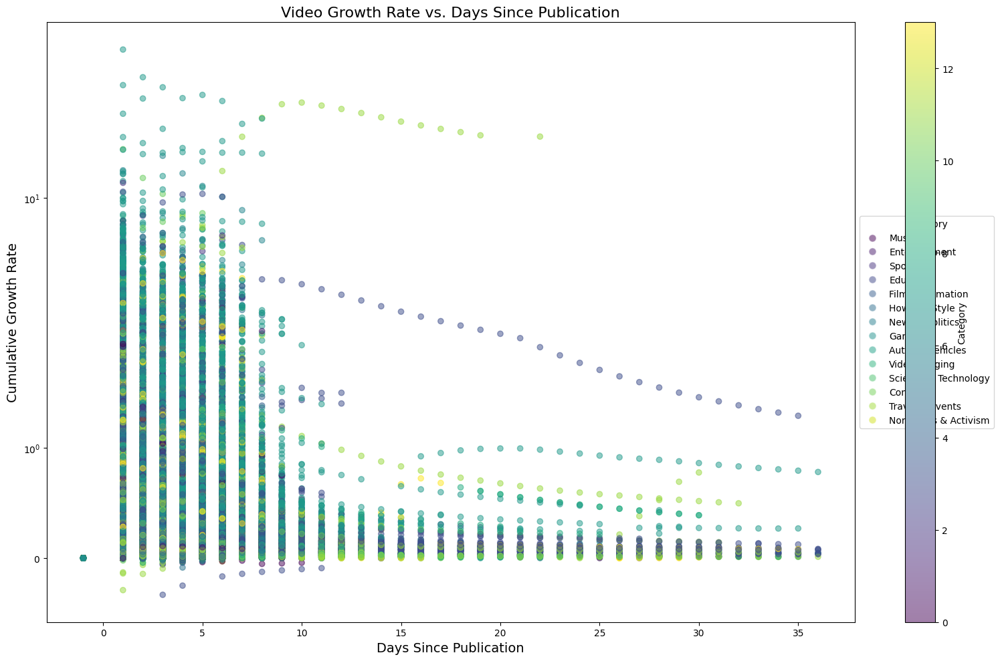

Summary Statistics:
                      cumulative_growth_rate                                 \
                                        mean    median       min        max   
category_name                                                                 
Autos & Vehicles                    0.207175  0.164862 -0.052001   7.693596   
Comedy                              0.206171  0.149758  0.000000   3.066835   
Education                           0.248291  0.200003 -0.058345  11.941333   
Entertainment                       0.240001  0.154417 -0.331854  10.769818   
Film & Animation                    0.244416  0.178982 -0.011342   6.673798   
Gaming                              0.178463  0.130340 -0.085119   7.310853   
Howto & Style                       0.244363  0.167679 -0.000860  16.315335   
Music                               0.443003  0.298339 -0.004223  55.839170   
News & Politics                     0.144083  0.066570 -0.049573   8.163497   
Nonprofits & Activism           

In [ ]:
df['trending_date'] = pd.to_datetime(df['trending_date'])
df['publishedAt'] = pd.to_datetime(df['publishedAt'])
df['days_since_publication'] = (df['trending_date'] - df['publishedAt']).dt.days
df_sorted = df.sort_values(['video_id', 'days_since_publication'])
df_sorted['cumulative_growth_rate'] = (df_sorted['view_count'] / df_sorted.groupby('video_id')['view_count'].transform('first') - 1) / df_sorted['days_since_publication']
df_sorted['cumulative_growth_rate'] = df_sorted['cumulative_growth_rate'].replace([np.inf, -np.inf], np.nan)

df_sorted = df_sorted.dropna(subset=['cumulative_growth_rate'])
plt.figure(figsize=(16, 10))
scatter = plt.scatter(df_sorted['days_since_publication'],
                      df_sorted['cumulative_growth_rate'],
                      c=df_sorted['category_name'].astype('category').cat.codes,
                      alpha=0.5,
                      cmap='viridis')

plt.title('Video Growth Rate vs. Days Since Publication', fontsize=16)
plt.xlabel('Days Since Publication', fontsize=14)
plt.ylabel('Cumulative Growth Rate', fontsize=14)
plt.yscale('symlog')

categories = df_sorted['category_name'].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.viridis(i / len(categories)),
                      markersize=8, alpha=0.5, label=cat) for i, cat in enumerate(categories)]
plt.legend(handles=handles, title='Category', loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

print("Summary Statistics:")
print(df_sorted.groupby('category_name').agg({
    'cumulative_growth_rate': ['mean', 'median', 'min', 'max'],
    'days_since_publication': ['mean', 'median', 'min', 'max']
}))

correlation = df_sorted['days_since_publication'].corr(df_sorted['cumulative_growth_rate'])
print(f"\nCorrelation between days since publication and cumulative growth rate: {correlation:.4f}")